## Import Libraries & Set Configurations

In [1]:
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.font_manager as font_manager
import plotly.graph_objects as go
import statsmodels.api as sm
from statsmodels.formula.api import ols
import locale

from os import getcwd, chdir, listdir
from datetime import timedelta
from datetime import datetime
from random import randint
from random import shuffle, sample


from matplotlib.font_manager import FontProperties, findfont
from matplotlib.patches import Patch
from plotly.subplots import make_subplots
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
from peakutils import indexes
from sklearn.preprocessing import MinMaxScaler
from locale import setlocale
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from scipy.stats import normaltest
from scipy.stats import mannwhitneyu
from scipy.stats import percentileofscore
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
import warnings


warnings.filterwarnings('ignore', 'SettingWithCopyWarning')

# Set the option to display decimals rounded to 2 numbers
pd.set_option('display.float_format', '{:.2f}'.format)

# Set the option to display 274 max rows
pd.set_option('display.max_rows', 100)

# Set the option to display a max of 20 cols
pd.set_option('display.max.columns', 20)


## Utility Functions & Plot Calibration

In [2]:
# function to keep track of df objects in memory

def dfs():
    dataframes = [var for var in globals() if isinstance(globals()[var], pd.DataFrame)]
    print(dataframes)

In [3]:
# Helper function to list available colormaps
def cmaps():
    # List available colormaps
    colormaps = plt.colormaps()

    # Print the list of colormaps
    for cmap in colormaps:
        print(cmap)

In [4]:
# Function to list individual colors available in MpL
def list_mpl_colors():
    # List of named colors available in Matplotlib
    named_colors = mcolors.CSS4_COLORS
    # Print the named colors
    for color_name, color_code in named_colors.items():
        print(f"{color_name}: {color_code}")

In [5]:
getcwd()

'/mnt/c/users/andre/repositories/portfolio/sample1_exploratory.data.analysis'

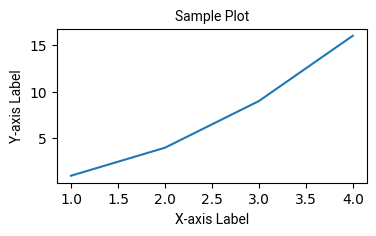

In [6]:
# Select font to use in plots
font_path = './Roboto-Regular.ttf'
roboto = font_manager.FontProperties(fname=font_path)

plt.figure(figsize=(4, 2))

# Create a sample plot
plt.plot([1, 2, 3, 4], [1, 4, 9, 16])

# Set the x and y axis labels 
plt.xlabel('X-axis Label', fontproperties=roboto, size=10)
plt.ylabel('Y-axis Label', fontproperties=roboto, size=10)

# Set the plot title 
plt.title('Sample Plot', fontproperties=roboto, size=10)

# Show the plot
plt.show()

## Set Working Directory, Import Datasets, & Review 

In [7]:
# Function to get & set working directory
def set_dir():
    cwd1 = getcwd()
    print(cwd1)
    chdir('/mnt/c/users/andre/repositories/portfolio/sample1_exploratory.data.analysis')
    cwd2 = getcwd()
    print(cwd2)

In [8]:
set_dir()

/mnt/c/users/andre/repositories/portfolio/sample1_exploratory.data.analysis
/mnt/c/users/andre/repositories/portfolio/sample1_exploratory.data.analysis


In [9]:
# Import all datasets
df1 = pd.read_csv('./datasets/cab.data.csv')
df2 = pd.read_csv('./datasets/city.csv')
df3 = pd.read_csv('./datasets/customer.id.csv')
df4 = pd.read_csv('./datasets/transactions.id.csv')

In [10]:
# Review Meta-data of Cab_Data.csv
display(df1.head())
display(df1.info())
display(df1.shape)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.63
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.85
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.63
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.60
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.78


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  int64  
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.2+ MB


None

(359392, 7)

In [11]:
# Review Meta-data of City.csv
display(df2.head())
display(df2.info())
display(df2.shape)

,City,Population,Users
0,NEW YORK NY,"8,405,837","302,149"
1,CHICAGO IL,"1,955,130","164,468"
2,LOS ANGELES CA,"1,595,037","144,132"
3,MIAMI FL,"1,339,155","17,675"
4,SILICON VALLEY,"1,177,609","27,247"


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     object
 2   Users       20 non-null     object
dtypes: object(3)
memory usage: 608.0+ bytes


None

(20, 3)

In [12]:
# Review Meta-data of Customer_ID.csv
display(df3.head())
display(df3.info())
display(df3.shape)

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


None

(49171, 4)

In [13]:
# Review Meta-data of Transaction_ID.csv
display(df4.head())
display(df4.info())
display(df4.shape)

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


None

(440098, 3)

## Merge to Create Master DataFrame

In [14]:
# Merge df1 & df4 on 'Transaction ID'
mdf = df1.merge(df4, on='Transaction ID', how='inner')
mdf.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.63,29290,Card
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.85,27703,Card
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.63,28712,Cash
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.60,28020,Cash
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.78,27182,Card


In [15]:
# Merge master dataframe & df3 on 'Customer ID'
mdf = mdf.merge(df3, on='Customer ID', how='inner')
mdf.head()



,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.63,29290,Card,Male,28,10813
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.85,27703,Card,Male,27,9237
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.63,28712,Cash,Male,53,11242
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.60,28020,Cash,Male,23,23327
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.78,27182,Card,Male,33,8536


In [16]:
# Rename df2 to cdf (city_dataframe)
cdf = df2

## Data Cleansing & Preprocessing

In [17]:
# Check both 'mdf' & 'cdf' for duplicates
def duplicates(df):
    before = df.shape[0]
    df = df.drop_duplicates()
    after = df.shape[0]
    return f'{before-after} duplicates were removed'

In [18]:
duplicates(mdf)

'0 duplicates were removed'

In [19]:
duplicates(cdf)

'0 duplicates were removed'

In [20]:
# Convert capital letters in columns to lowercase for uniformity 
def lowercase(df):
    for i, colname in enumerate(df):
        if df[colname].dtype == 'object':
            df[colname] = df[colname].str.lower()
    return df.head()
    

In [21]:
lowercase(mdf)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,42377,pink cab,atlanta ga,30.45,370.95,313.63,29290,card,male,28,10813
1,10000012,42375,pink cab,atlanta ga,28.62,358.52,334.85,27703,card,male,27,9237
2,10000013,42371,pink cab,atlanta ga,9.04,125.20,97.63,28712,cash,male,53,11242
3,10000014,42376,pink cab,atlanta ga,33.17,377.40,351.60,28020,cash,male,23,23327
4,10000015,42372,pink cab,atlanta ga,8.73,114.62,97.78,27182,card,male,33,8536


In [22]:
lowercase(cdf)

,City,Population,Users
0,new york ny,"8,405,837","302,149"
1,chicago il,"1,955,130","164,468"
2,los angeles ca,"1,595,037","144,132"
3,miami fl,"1,339,155","17,675"
4,silicon valley,"1,177,609","27,247"


In [23]:
# Convert missing value representations to NaN, if any
mdf.replace(['n/a', '-999', '?', '###', '-', 'na', 'null'], float('NaN'), inplace=True)
cdf.replace(['n/a', '-999', '?', '###', '-', 'na', 'null'], float('NaN'), inplace=True)
display(mdf.isnull().sum())
display(cdf.isnull().sum())

Transaction ID        0
Date of Travel        0
Company               0
City                  0
KM Travelled          0
Price Charged         0
Cost of Trip          0
Customer ID           0
Payment_Mode          0
Gender                0
Age                   0
Income (USD/Month)    0
dtype: int64

City          0
Population    0
Users         0
dtype: int64

In [24]:
# Rename columns of dataframe
mdf_names = {'Transaction ID':'trans_id', 'Date of Travel':'date', 'Company':'company', 'City':'city', 
             'KM Travelled':'trip_miles', 'Price Charged':'price', 'Cost of Trip':'cost', 'Customer ID':'cust_id', 
             'Payment_Mode':'payment_type', 'Gender':'gender', 'Age':'age', 'Income (USD/Month)':'income'}

# Create a mapper
cdf_names = {'City':'city', 'Population':'pop', 'Users':'users'}

# Rename columns
mdf.rename(columns=mdf_names, inplace=True)
cdf.rename(columns=cdf_names, inplace=True)

# Display
display(mdf.head())
display(cdf.head())

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income
0,10000011,42377,pink cab,atlanta ga,30.45,370.95,313.63,29290,card,male,28,10813
1,10000012,42375,pink cab,atlanta ga,28.62,358.52,334.85,27703,card,male,27,9237
2,10000013,42371,pink cab,atlanta ga,9.04,125.20,97.63,28712,cash,male,53,11242
3,10000014,42376,pink cab,atlanta ga,33.17,377.40,351.60,28020,cash,male,23,23327
4,10000015,42372,pink cab,atlanta ga,8.73,114.62,97.78,27182,card,male,33,8536


,city,pop,users
0,new york ny,"8,405,837","302,149"
1,chicago il,"1,955,130","164,468"
2,los angeles ca,"1,595,037","144,132"
3,miami fl,"1,339,155","17,675"
4,silicon valley,"1,177,609","27,247"


In [25]:
km_per_mile = 1.609934

# Transform the 'trip_miles' feature from "km's" to 'miles' 30.45
mdf['trip_miles'] = mdf['trip_miles']/km_per_mile
mdf.head()

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income
0,10000011,42377,pink cab,atlanta ga,18.91,370.95,313.63,29290,card,male,28,10813
1,10000012,42375,pink cab,atlanta ga,17.78,358.52,334.85,27703,card,male,27,9237
2,10000013,42371,pink cab,atlanta ga,5.62,125.20,97.63,28712,cash,male,53,11242
3,10000014,42376,pink cab,atlanta ga,20.60,377.40,351.60,28020,cash,male,23,23327
4,10000015,42372,pink cab,atlanta ga,5.42,114.62,97.78,27182,card,male,33,8536


In [26]:
# Switch Excel date format to standard date format
mdf['date'] = pd.to_datetime('1900-01-01') + pd.to_timedelta(mdf['date'] - 2, unit = 'D')
mdf.head()

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income
0,10000011,2016-01-08,pink cab,atlanta ga,18.91,370.95,313.63,29290,card,male,28,10813
1,10000012,2016-01-06,pink cab,atlanta ga,17.78,358.52,334.85,27703,card,male,27,9237
2,10000013,2016-01-02,pink cab,atlanta ga,5.62,125.20,97.63,28712,cash,male,53,11242
3,10000014,2016-01-07,pink cab,atlanta ga,20.60,377.40,351.60,28020,cash,male,23,23327
4,10000015,2016-01-03,pink cab,atlanta ga,5.42,114.62,97.78,27182,card,male,33,8536


In [27]:
# Create quarter labels
qrtr_labels = {1:'Q1', 2:'Q2', 3:'Q3', 4:'Q4'}

# Extract the 'quarter' into a feature column
mdf['quarter'] = pd.to_datetime(mdf['date']).dt.quarter

# Map 'qrtr_labels' to the feature column
mdf['quarter'] = mdf['quarter'].map(qrtr_labels)

# Extract the 'year' into a feature column
mdf['year'] = pd.to_datetime(mdf['date']).dt.year

# Concatenate the 'quarter' and 'year' columns into the 'quarters' feature column
mdf['quarters'] = mdf['quarter'].astype(str) + '-' + mdf['year'].astype(str)

# Display
mdf.head()

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income,quarter,year,quarters
0,10000011,2016-01-08,pink cab,atlanta ga,18.91,370.95,313.63,29290,card,male,28,10813,Q1,2016,Q1-2016
1,10000012,2016-01-06,pink cab,atlanta ga,17.78,358.52,334.85,27703,card,male,27,9237,Q1,2016,Q1-2016
2,10000013,2016-01-02,pink cab,atlanta ga,5.62,125.20,97.63,28712,cash,male,53,11242,Q1,2016,Q1-2016
3,10000014,2016-01-07,pink cab,atlanta ga,20.60,377.40,351.60,28020,cash,male,23,23327,Q1,2016,Q1-2016
4,10000015,2016-01-03,pink cab,atlanta ga,5.42,114.62,97.78,27182,card,male,33,8536,Q1,2016,Q1-2016


In [28]:
def city_state_split(series1, name1, series2, name2):
    # Create a generic list
    lst1 = []
    for city in series1[name1]:
        lst2 = city.split()
        lst1.append(lst2[-1])

    # Create a new Series object 
    state = pd.Series(lst1)
    series2[name2] = state

    # Replace 'state' in the 'city' column
    lst3 = []
    for city in series1[name1]:
        lst4 = city.split()
        del lst4[-1]
        new_city = ' '.join(lst4)
        lst3.append(new_city)
    
    # Create new series
    series1[name1] = lst3
    
    # Replace 'county' & 'valley' with 'ca'
    for i in range(len(series2[name2])):
        if series2[name2][i] == 'county' or series2[name2][i] == 'valley':
            series2.loc[i, name2] = 'ca'


In [29]:

# Separate the city and the state in the default 'city' variable
city_state_split(mdf, 'city', mdf, 'state')

# List 'mdf' columns
new_order = ['date', 'trans_id', 'cust_id', 'company', 
             'city', 'state', 'trip_miles', 'price', 
             'cost','payment_type', 'gender', 'age', 
             'income', 'quarter', 'year', 'quarters']

# Reorder 'mdf' columns
mdf = mdf.reindex(columns=new_order)
    
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,28,10813,Q1,2016,Q1-2016
1,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,27,9237,Q1,2016,Q1-2016
2,2016-01-02,10000013,28712,pink cab,atlanta,ga,5.62,125.20,97.63,cash,male,53,11242,Q1,2016,Q1-2016
3,2016-01-07,10000014,28020,pink cab,atlanta,ga,20.60,377.40,351.60,cash,male,23,23327,Q1,2016,Q1-2016
4,2016-01-03,10000015,27182,pink cab,atlanta,ga,5.42,114.62,97.78,card,male,33,8536,Q1,2016,Q1-2016


In [30]:
# Make a profit column
mdf['profit'] = mdf['price'] - mdf['cost']
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,28,10813,Q1,2016,Q1-2016,57.31
1,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,27,9237,Q1,2016,Q1-2016,23.67
2,2016-01-02,10000013,28712,pink cab,atlanta,ga,5.62,125.20,97.63,cash,male,53,11242,Q1,2016,Q1-2016,27.57
3,2016-01-07,10000014,28020,pink cab,atlanta,ga,20.60,377.40,351.60,cash,male,23,23327,Q1,2016,Q1-2016,25.80
4,2016-01-03,10000015,27182,pink cab,atlanta,ga,5.42,114.62,97.78,card,male,33,8536,Q1,2016,Q1-2016,16.84


In [31]:
# Create a 'day-of-the-week' column so we can analyze the busiest days
mdf['day_of_week'] = mdf['date'].dt.day_name().str.lower()
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,28,10813,Q1,2016,Q1-2016,57.31,friday
1,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,27,9237,Q1,2016,Q1-2016,23.67,wednesday
2,2016-01-02,10000013,28712,pink cab,atlanta,ga,5.62,125.20,97.63,cash,male,53,11242,Q1,2016,Q1-2016,27.57,saturday
3,2016-01-07,10000014,28020,pink cab,atlanta,ga,20.60,377.40,351.60,cash,male,23,23327,Q1,2016,Q1-2016,25.80,thursday
4,2016-01-03,10000015,27182,pink cab,atlanta,ga,5.42,114.62,97.78,card,male,33,8536,Q1,2016,Q1-2016,16.84,sunday


In [32]:
mdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          359392 non-null  datetime64[ns]
 1   trans_id      359392 non-null  int64         
 2   cust_id       359392 non-null  int64         
 3   company       359392 non-null  object        
 4   city          359392 non-null  object        
 5   state         359392 non-null  object        
 6   trip_miles    359392 non-null  float64       
 7   price         359392 non-null  float64       
 8   cost          359392 non-null  float64       
 9   payment_type  359392 non-null  object        
 10  gender        359392 non-null  object        
 11  age           359392 non-null  int64         
 12  income        359392 non-null  int64         
 13  quarter       359392 non-null  object        
 14  year          359392 non-null  int32         
 15  quarters      359

In [33]:
# We will save 25% of the memory by converting data types from 'object' to 'category' 48.0+ MB --> 28.8 MB
for colname in mdf:
    if mdf[colname].dtype == 'object' and colname != 'day_of_week':
        mdf[colname] = pd.Categorical(mdf[colname], ordered=False)
    
    # Convert 'day_of_week' to ordinal data
    elif mdf[colname].dtype == 'object' and colname == 'day_of_week':
        mdf[colname] = pd.Categorical(mdf[colname], categories=['sunday', 'monday', 'tuesday', 'wednesday',
                                                                'thursday', 'friday', 'saturday'], ordered=True)

mdf.info()   

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          359392 non-null  datetime64[ns]
 1   trans_id      359392 non-null  int64         
 2   cust_id       359392 non-null  int64         
 3   company       359392 non-null  category      
 4   city          359392 non-null  category      
 5   state         359392 non-null  category      
 6   trip_miles    359392 non-null  float64       
 7   price         359392 non-null  float64       
 8   cost          359392 non-null  float64       
 9   payment_type  359392 non-null  category      
 10  gender        359392 non-null  category      
 11  age           359392 non-null  int64         
 12  income        359392 non-null  int64         
 13  quarter       359392 non-null  category      
 14  year          359392 non-null  int32         
 15  quarters      359

In [34]:
# Create age_labels and bin-edges
age_labels = ['18-24', '25-34', '35-54', '55-64']
age_bins = [17, 25, 35, 55, 65]

# Apply the labels to the 'age' column
mdf['age_category'] = pd.cut(x=mdf['age'], bins=age_bins, labels=age_labels, ordered=True)

# Display
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week,age_category
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,28,10813,Q1,2016,Q1-2016,57.31,friday,25-34
1,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,27,9237,Q1,2016,Q1-2016,23.67,wednesday,25-34
2,2016-01-02,10000013,28712,pink cab,atlanta,ga,5.62,125.20,97.63,cash,male,53,11242,Q1,2016,Q1-2016,27.57,saturday,35-54
3,2016-01-07,10000014,28020,pink cab,atlanta,ga,20.60,377.40,351.60,cash,male,23,23327,Q1,2016,Q1-2016,25.80,thursday,18-24
4,2016-01-03,10000015,27182,pink cab,atlanta,ga,5.42,114.62,97.78,card,male,33,8536,Q1,2016,Q1-2016,16.84,sunday,25-34


In [35]:
# Use regex to remove commas from 'pop' and 'users'

cdf['pop'] = cdf['pop'].str.replace(r',', '', regex=True).astype('int64')
cdf['users'] = cdf['users'].str.replace(r',', '', regex=True).astype('int64')
cdf.head()

,city,pop,users
0,new york ny,8405837,302149
1,chicago il,1955130,164468
2,los angeles ca,1595037,144132
3,miami fl,1339155,17675
4,silicon valley,1177609,27247


In [36]:
# Create profit_margin feature for each row

mdf['profit_margin'] = mdf['profit']/mdf['price']

In [37]:
# Create feature
cdf['% of users'] = cdf['users']/cdf['pop']
cdf.head()

,city,pop,users,% of users
0,new york ny,8405837,302149,0.04
1,chicago il,1955130,164468,0.08
2,los angeles ca,1595037,144132,0.09
3,miami fl,1339155,17675,0.01
4,silicon valley,1177609,27247,0.02


In [38]:
# Use function to separate the city and state to create a new 'state' feature
city_state_split(cdf, 'city', cdf, 'state')

# Sort by 'city' 
cdf.sort_values(by='city', inplace=True)

# Reset the index
cdf.reset_index(drop=True, inplace=True)

# Display
cdf.head()

,city,pop,users,% of users,state
0,atlanta,814885,24701,0.03,ga
1,austin,698371,14978,0.02,tx
2,boston,248968,80021,0.32,ma
3,chicago,1955130,164468,0.08,il
4,dallas,942908,22157,0.02,tx


In [39]:
# Create a separate dataframe for each companies' observations
pcab = mdf[mdf['company'] == 'pink cab']
ycab = mdf[mdf['company'] == 'yellow cab']

## Initial Exploration of Features

In [40]:
# List continuous features
cont_features = ['trip_miles', 'price', 'cost', 'age', 'income', 'profit', 'profit_margin']

# List Categorical
cat_features = ['company', 'city', 'state', 'payment_type', 'gender', 'quarter', 'year', 'quarters' 'day_of_week', 
                'age_category']

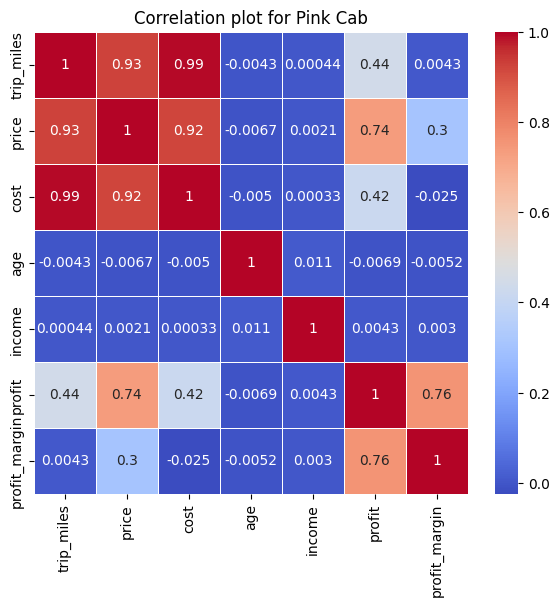

In [41]:
pink_corr_matrix = pcab[cont_features].corr()

# Plot the correlation matrix of the continuous features as a heatmap
plt.figure(figsize=(7, 6))
sns.heatmap(pink_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation plot for Pink Cab')
plt.show()

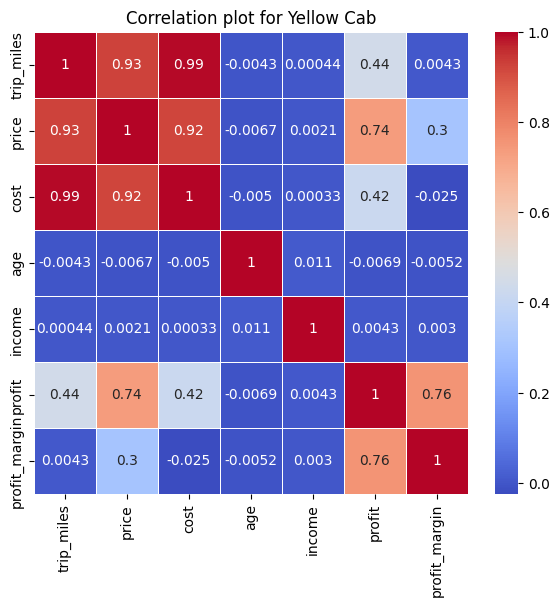

In [42]:
# Create matrix
yellow_corr_matrix = ycab[cont_features].corr()

# Plot yellow cab's correlation matrix of the continuous features as a heatmap
plt.figure(figsize=(7, 6))
sns.heatmap(pink_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation plot for Yellow Cab')
plt.show()

In [43]:
# Total number of Pink Cab rides
print('\nPink Cab total # of rides over 3 years: ', len(pcab), '\n')

# Total number of Yellow Cab rides
print('Yellow Cab total # of rides over 3 years: ', len(ycab), '\n')

# Sample size disparity skewed in favor of Yellow Cab
print('Yellow Cab has made: ', len(ycab)-len(pcab), ' more trips than Pink Cab, over the last 3 years\n')


Pink Cab total # of rides over 3 years:  84711 

Yellow Cab total # of rides over 3 years:  274681 

Yellow Cab has made:  189970  more trips than Pink Cab, over the last 3 years



In [44]:
# Since correlations are identical, this suggests homogenous market conditions and similar pricing strategies for both companies
# This is true even given the disparity between the sample sizes

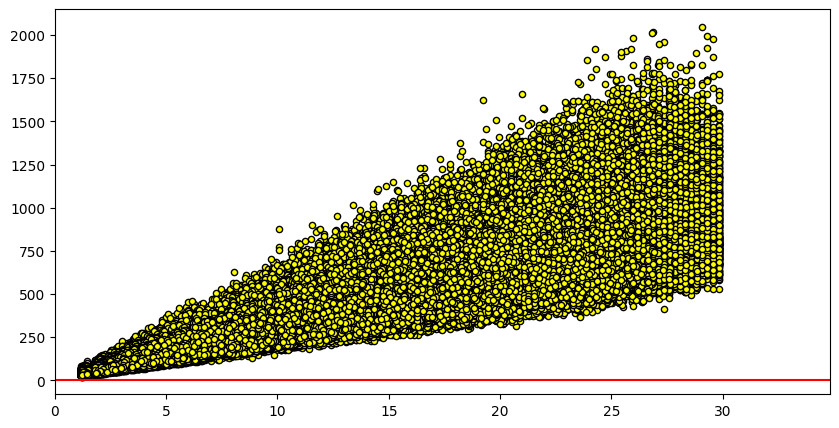

In [45]:
# Scatter Plot of age & profit_margin for yellow cab
plt.figure(figsize=(10, 5))
plt.xlim(0, max(ycab['trip_miles']) + 5)
plt.scatter(ycab['trip_miles'], ycab['price'], color='yellow', edgecolor='black', s=20)
plt.axhline(y=0, color='red')

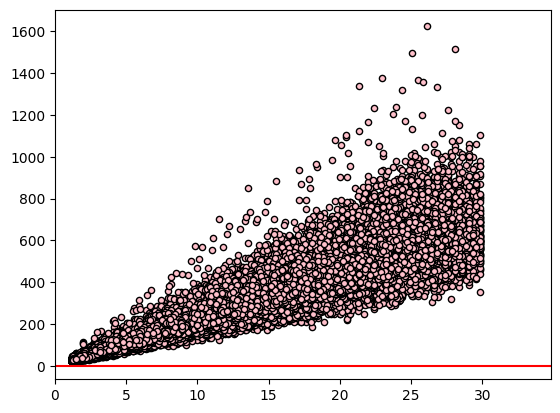

In [46]:
# Scatter Plot of age & profit_margin for yellow cab
plt.xlim(0, max(pcab['trip_miles']) + 5)
plt.scatter(pcab['trip_miles'], pcab['price'], color='pink', edgecolor='black', s=20)
plt.axhline(y=0, color='red')

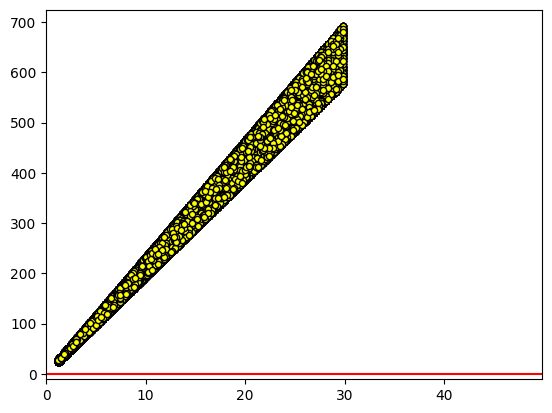

In [47]:
# Scatter Plot of 'trip_miles' & 'cost' for Yellow Cab
plt.xlim(0, max(ycab['trip_miles']) + 20)
plt.scatter(ycab['trip_miles'], ycab['cost'], color='yellow', edgecolor='black', s=20)
plt.axhline(y=0, color='red')

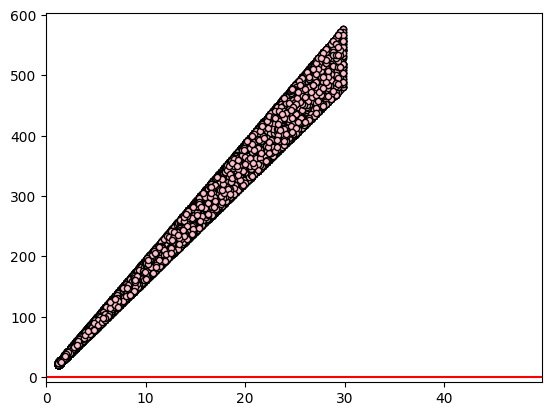

In [48]:
# Scatter Plot of 'trip_miles' & 'cost' for Pink Cab
plt.xlim(0, max(pcab['trip_miles']) + 20)
plt.scatter(pcab['trip_miles'], pcab['cost'], color='pink', edgecolor='black', s=20)
plt.axhline(y=0, color='red')

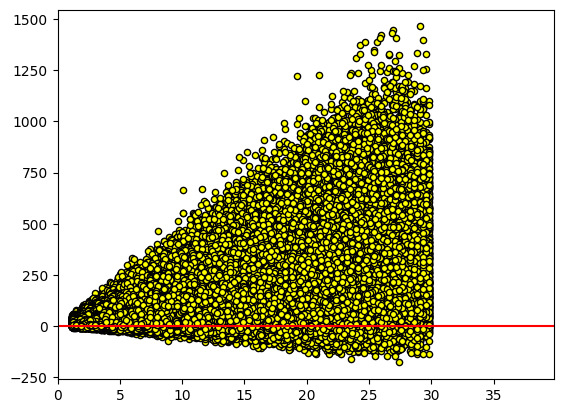

In [49]:
# Scatter Plot of 'trip_miles' & 'profit' for Yellow Cab
plt.xlim(0, max(ycab['trip_miles']) + 10)
plt.scatter(ycab['trip_miles'], ycab['profit'], color='yellow', edgecolor='black', s=20)
plt.axhline(y=0, color='red')

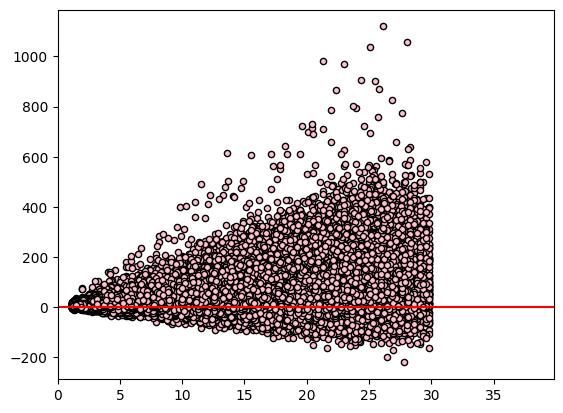

In [50]:
# Scatter Plot of 'trip_miles' & 'profit' for Yellow Cab
plt.xlim(0, max(pcab['trip_miles']) + 10)
plt.scatter(pcab['trip_miles'], pcab['profit'], color='pink', edgecolor='black', s=20)
plt.axhline(y=0, color='red')

### Outlier Analysis

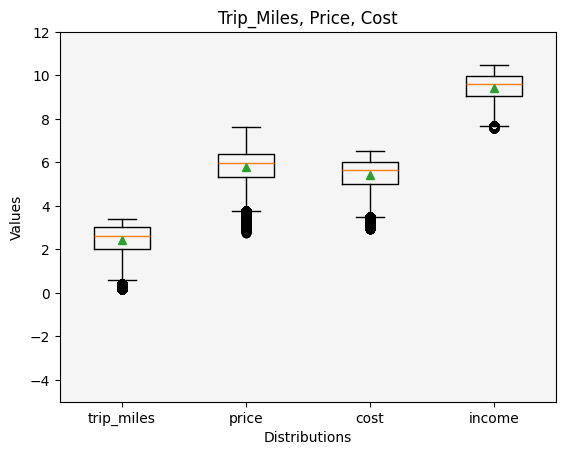

In [51]:

# Extract the continuous features into a DataFrame
cont_feat_df = mdf[cont_features]

# Overwrite any zeros in the series with the mean of the series
cont_feat_df.loc[cont_feat_df['profit_margin'] == 0, 'profit_margin'] = np.mean(cont_feat_df['profit_margin'])
cont_feat_df.loc[cont_feat_df['profit'] == 0, 'profit'] = np.mean(cont_feat_df['profit'])
cont_feat_df.loc[cont_feat_df['income'] == 0, 'income'] = np.mean(cont_feat_df['income']).astype(int)

# Combine the data into a list or tuple
data = [np.log(cont_feat_df['trip_miles']), np.log(cont_feat_df['price']), np.log(cont_feat_df['cost']), 
        np.log(cont_feat_df['income'])]

# Create a figure and axes
fig, ax = plt.subplots()

# Create the boxplots
ax.boxplot(data, showmeans=True)

# Add labels to the x-axis tick positions
ax.set_xticklabels(['trip_miles', 'price', 'cost', 'income'])

# Add a title and labels
ax.set_facecolor('whitesmoke')
ax.set_title('Trip_Miles, Price, Cost')
ax.set_xlabel('Distributions')
ax.set_ylabel('Values')
ax.set_ylim(-5, 12)

# Show the plot
plt.show()

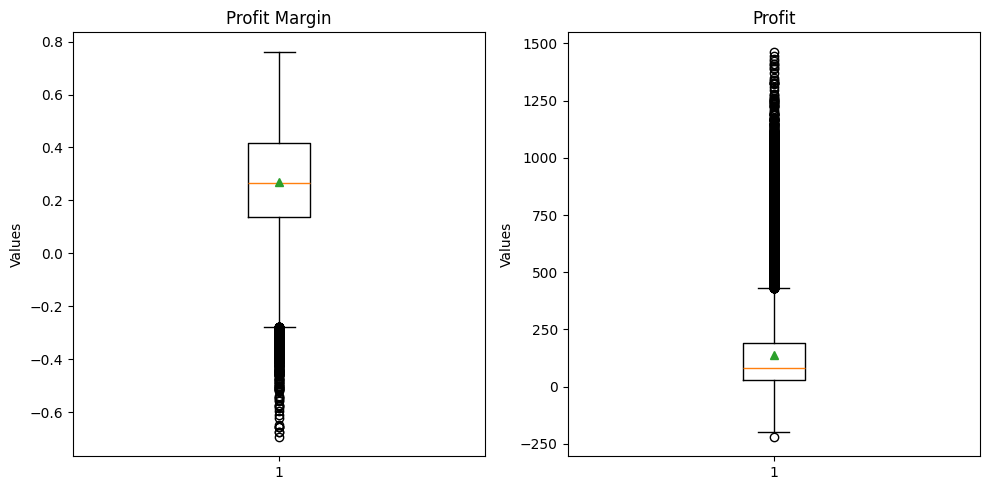

In [52]:
profit_margin = cont_feat_df['profit_margin'] 
profit = cont_feat_df['profit']

# Create a figure and a grid of subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Create boxplots for profit_margin
ax1.boxplot(profit_margin, showmeans=True)
ax1.set_title('Profit Margin')
ax1.set_ylabel('Values')

# Create boxplots for profit
ax2.boxplot(profit, showmeans=True)
ax2.set_title('Profit')
ax2.set_ylabel('Values')

# Adjust layout spacing
plt.tight_layout()

# Show the plot
plt.show()

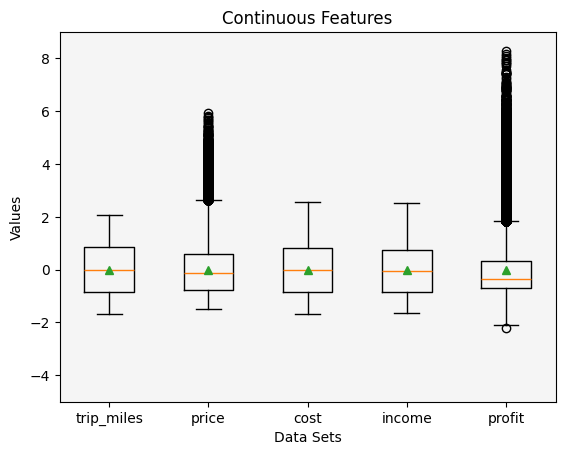

In [53]:
# Assuming cont_features is a list of continuous feature column names
# Extract the continuous features into a DataFrame
cont_features_df = mdf[cont_features]

# Instantiate standard scaler object
scaler1 = StandardScaler(with_mean=True, with_std=True, copy=True)

# Fit and transform the DataFrame using StandardScaler
cont_feat_copy = scaler1.fit_transform(cont_features_df)

# Convert the scaled data back to a DataFrame
cont_feat_copy_df = pd.DataFrame(cont_feat_copy, columns=cont_features_df.columns)

# Combine the data into a list or tuple
data = [cont_feat_copy_df['trip_miles'], cont_feat_copy_df['price'], cont_feat_copy_df['cost'], 
        cont_feat_copy_df['income'], cont_feat_copy_df['profit']]

# Create a figure and axes
fig, ax = plt.subplots()

# Create the boxplots
ax.boxplot(data, showmeans=True)

# Add labels to the x-axis tick positions
ax.set_xticklabels(['trip_miles', 'price', 'cost', 'income', 'profit'])

# Add a title and labels
ax.set_facecolor('whitesmoke')
ax.set_title('Continuous Features')
ax.set_xlabel('Data Sets')
ax.set_ylabel('Values')
ax.set_ylim(-5, 9)

# Show the plot
plt.show()



## Save Progress

In [54]:
# # Save 'mdf' & rest of progress in 'pickle' format to preserve categories & data types
# mdf.to_pickle('mdf.pkl')

# # Save 'cdf' & rest of progress in 'pickle' format
# mdf.to_pickle('cdf.pkl')

In [55]:
# set_dir()

In [56]:
# # Read in 'mdf'
# mdf = pd.read_csv('mdf.csv')

# # Read in 'cdf'
# cdf = pd.read_csv('cdf.csv')

# Descriptive Statistics

In [57]:
# Get summary stats from a subset of 'mdf'
ydescriptive = mdf[mdf['company']=='yellow cab'][cont_features].describe()
ydescriptive

,trip_miles,price,cost,age,income,profit,profit_margin
count,274681.00,274681.00,274681.00,274681.00,274681.00,274681.00,274681.00
mean,14.02,458.18,297.92,35.34,15045.67,160.26,0.30
std,7.60,288.39,162.55,12.58,7962.73,171.82,0.18
min,1.18,20.73,22.80,18.00,2000.00,-176.93,-0.55
25%,7.45,226.68,158.40,25.00,8439.00,37.18,0.16
50%,13.94,425.06,295.60,33.00,14676.00,102.00,0.30
75%,20.47,633.88,432.43,42.00,21023.00,228.67,0.45
max,29.81,2048.03,691.20,65.00,34996.00,1463.97,0.76


In [58]:
# Get summary stats from a subset of 'mdf'
pdescriptive = mdf[mdf['company'] == 'pink cab'][cont_features].describe()
pdescriptive

,trip_miles,price,cost,age,income,profit,profit_margin
count,84711.00,84711.00,84711.00,84711.00,84711.00,84711.00,84711.00
mean,14.01,310.80,248.15,35.32,15059.05,62.65,0.17
std,7.60,182.00,135.40,12.64,7991.08,77.59,0.16
min,1.18,15.60,19.00,18.00,2000.00,-220.06,-0.69
25%,7.45,159.97,131.87,25.00,8371.00,11.21,0.07
50%,13.94,298.06,246.33,33.00,14713.00,41.50,0.18
75%,20.47,441.50,360.18,42.00,21055.00,93.97,0.28
max,29.81,1623.48,576.00,65.00,35000.00,1119.48,0.73


In [59]:
# yellow avg price per mile
yavg_ppm = ydescriptive['price']['mean']/ydescriptive['trip_miles']['mean']
print('Average price per mile (Yellow Cab): ', '$', round(yavg_ppm, 2))

# yellow avg cost per mile
yavg_cpm = ydescriptive['cost']['mean']/ydescriptive['trip_miles']['mean']
print('Average cost per mile (Yellow Cab): ', '$', round(yavg_cpm, 2))

# yellow avg profit per mile
yavg_prpm = ydescriptive['profit']['mean']/ydescriptive['trip_miles']['mean']
print('Average profit per mile (Yellow Cab): ', '$', round(yavg_prpm, 2))

# pink avg price per mile
pavg_ppm = pdescriptive['price']['mean']/pdescriptive['trip_miles']['mean']
print('Average price per mile (Pink Cab): ', '$', round(pavg_ppm, 2))

# pink avg cost per mile
pavg_cpm = pdescriptive['cost']['mean']/pdescriptive['trip_miles']['mean']
print('Average cost per mile (Pink Cab): ', '$', round(pavg_cpm, 2))

# pink avg cost per mile
pavg_prpm = pdescriptive['profit']['mean']/pdescriptive['trip_miles']['mean']
print('Average profit per mile (Pink Cab): ', '$', round(pavg_prpm, 2))



Average price per mile (Yellow Cab):  $ 32.68
Average cost per mile (Yellow Cab):  $ 21.25
Average profit per mile (Yellow Cab):  $ 11.43
Average price per mile (Pink Cab):  $ 22.18
Average cost per mile (Pink Cab):  $ 17.71
Average profit per mile (Pink Cab):  $ 4.47


In [60]:
# Number of days in entire data set
tot_num_days = len(mdf['date'].unique())
print('# of days in dataset: ', tot_num_days)

# Length of a year in days
year_len = 365.25

# Years in data set
print('# of years in dataset: ', round(tot_num_days/year_len, 2))


pink_cab = mdf[mdf['company'] == 'pink cab']
num_pink_fares = len(pink_cab)
print('Total # of fares (Pink Cab): ', num_pink_fares)
        
yellow_cab = mdf[mdf['company'] == 'yellow cab']
num_yellow_fares = len(yellow_cab)
print('Total # of fares (Yellow Cab): ', num_yellow_fares)

# Combined profit margin 
combined_profit_margin = mdf['profit'].sum()/mdf['price'].sum()
print('Combined profit margin: ', round(combined_profit_margin, 2))

# Pink cab profit margin
pink_revenue = pink_cab['price'].sum()
pink_profits = pink_cab['profit'].sum()
pink_profit_margin = pink_profits/pink_revenue
print('Overall profit margin (Pink Cab): ', pink_profit_margin.round(2))

# Yellow cab profit margin
yellow_revenue = yellow_cab['price'].sum()
yellow_profit = yellow_cab['profit'].sum()
yellow_profit_margin = yellow_profit/yellow_revenue
print('Overall profit margin (Yellow Cab): ', yellow_profit_margin.round(2))

# Pink cab avg price per fare
pink_avg_fare = pink_cab['price'].sum()/num_pink_fares
print('Average price per fare (Pink Cab): ', pink_avg_fare.round(2))

# Yellow cab avg price per fare
yellow_avg_fare = yellow_cab['price'].sum()/num_yellow_fares
print('Average price per fare (Yellow Cab): ', yellow_avg_fare.round(2))

# Pinks avg miles per fare
pink_avg_mile = pink_cab['trip_miles'].sum()/num_pink_fares
print('Average miles per fare (Pink Cab): ', pink_avg_mile.round(2))

# Yellow avg miles per fare
yellow_avg_mile = yellow_cab['trip_miles'].sum()/num_yellow_fares
print('Average miles per fare (Yellow Cab): ', yellow_avg_mile.round(2))

# How many more fares did yellow have over pink
print('The average (Yellow Cab) fare is approx: %', round(yellow_avg_fare/pink_avg_fare, 2)*100, 'more than Pink Cab')


# of days in dataset:  1095
# of years in dataset:  3.0
Total # of fares (Pink Cab):  84711
Total # of fares (Yellow Cab):  274681
Combined profit margin:  0.32
Overall profit margin (Pink Cab):  0.2
Overall profit margin (Yellow Cab):  0.35
Average price per fare (Pink Cab):  310.8
Average price per fare (Yellow Cab):  458.18
Average miles per fare (Pink Cab):  14.01
Average miles per fare (Yellow Cab):  14.02
The average (Yellow Cab) fare is approx: % 147.0 more than Pink Cab


# Does Cab Company Impact Client Frequency?

In [61]:
# Function to format plots similarly

def format_plot(data, fig, ax, xlab, ylab, title):
    # Set labels and title
    ax.set_xlabel(xlab, fontproperties=roboto, fontsize=10)
    ax.set_ylabel(ylab, fontproperties=roboto, fontsize=10)
    ax.set_title(title, fontproperties=roboto, fontsize=12)
    
    # Set tick parameters
    ax.tick_params(axis='x', labelrotation=45, labelsize=7)
    ax.tick_params(axis='y', labelsize=5)  # Set font size for y-axis ticks
    
    # Set spines linewidth
    ax.spines['left'].set_linewidth(0.5)
    ax.spines['bottom'].set_linewidth(0.5)
    ax.spines['top'].set_linewidth(0.3)
    ax.spines['right'].set_linewidth(0.3)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1, 1), prop={'size': 7})
    
    # Set background color
    ax.set_facecolor('whitesmoke')
    
    # Set plot perimeter color
    perimeter_color = 'black'  # Set the desired perimeter color
    ax.spines['top'].set_color(perimeter_color)
    ax.spines['right'].set_color(perimeter_color)
    ax.spines['bottom'].set_color(perimeter_color)
    ax.spines['left'].set_color(perimeter_color)
    
    # Display the plot
    plt.tight_layout()
    plt.grid(True, linewidth=0.1, color='black')
    plt.show()


## Separate Customers According to Cab Company Choice

In [62]:
# This code calculates who only rides with Pink Cab or Yellow Cab, or Pink Cab and Yellow Cab

# Create a dictionary to store the sub dataframes
sub_dfs = {}

# Group the master dataframe by customer ID and aggregate unique cab companies as a list
grouped = mdf.groupby('cust_id')['company'].unique().reset_index()

# Rename the column for clarity
grouped.rename(columns={'company': 'companies'}, inplace=True)

# Convert the unique_companies column to a list
grouped['companies'] = grouped['companies'].apply(list)

# Initialize empty lists to store customer IDs for each category
pink_cab_only = []
yellow_cab_only = []
both_cabs = []

# Iterate over each row in the grouped dataframe
for idx, row in grouped.iterrows():
    # Check if the customer exclusively took rides with Pink Cab
    if 'pink cab' in row['companies'] and 'yellow cab' not in row['companies']:
        pink_cab_only.append(row['cust_id'])
    # Check if the customer exclusively took rides with Yellow Cab
    elif 'yellow cab' in row['companies'] and 'pink cab' not in row['companies']:
        yellow_cab_only.append(row['cust_id'])
    # Check if the customer took rides with both Pink Cab and Yellow Cab
    elif 'pink cab' in row['companies'] and 'yellow cab' in row['companies']:
        both_cabs.append(row['cust_id'])

# Filter the master dataframe to create separate dataframes for each category
pcab0 = mdf[mdf['cust_id'].isin(pink_cab_only)]
ycab0 = mdf[mdf['cust_id'].isin(yellow_cab_only)]
pcabycab = mdf[mdf['cust_id'].isin(both_cabs)]




In [63]:
print('# of customers who only used (Pink Cab): ', len(pcab0))
print('# of customers who only used (Yellow Cab): ', len(ycab0))
print('# of customers who used both: ', len(pcabycab))
print('Confirm: ', len(pcab0) + len(ycab0) + len(pcabycab) == len(mdf))

# of customers who only used (Pink Cab):  8421
# of customers who only used (Yellow Cab):  40453
# of customers who used both:  310518
Confirm:  True


In [64]:
# Average age of a client who only uses Pink Cab
print(pcab0.describe()['age'], '\n')

# Average profit_margin per trip from clients who only ride with Pink Cab
print(pcab0.describe()['profit_margin'])

count   8421.00
mean      35.38
min       18.00
25%       25.00
50%       33.00
75%       42.00
max       65.00
std       12.70
Name: age, dtype: float64 

count   8421.00
mean       0.14
min       -0.66
25%        0.03
50%        0.16
75%        0.27
max        0.70
std        0.18
Name: profit_margin, dtype: float64


In [65]:
# Average age of a client who only rides with Yellow Cab
print(ycab0.describe()['age'], '\n')

# Average profit_margin per trip from clients who only ride with Yellow Cab
print(ycab0.describe()['profit_margin'])

count   40453.00
mean       35.04
min        18.00
25%        25.00
50%        33.00
75%        41.00
max        65.00
std        12.44
Name: age, dtype: float64 

count   40453.00
mean        0.24
min        -0.55
25%         0.14
50%         0.25
75%         0.35
max         0.75
std         0.15
Name: profit_margin, dtype: float64


In [66]:
# Average age of a client who rides with both Pink Cab & Yellow Cab
print(pcabycab.describe()['age'], '\n')

# Average profit_margin per trip from clients who ride with Pink Cab & Yellow cab
print(pcabycab.describe()['profit_margin'])

count   310518.00
mean        35.37
min         18.00
25%         25.00
50%         33.00
75%         42.00
max         65.00
std         12.61
Name: age, dtype: float64 

count   310518.00
mean         0.28
min         -0.69
25%          0.14
50%          0.27
75%          0.43
max          0.76
std          0.19
Name: profit_margin, dtype: float64


In [67]:

# Function that creates labels on top of histogram bars
def bar_labels(ax, hist, patches, total, fontsize=6):
    # Calculate the total number of samples
    total_samples = sum(hist)
    
    # Attach a text label above each bar in *hist*, displaying its percentage
    for val, patch in zip(hist, patches):
        if val > 0:
            percentage = (val / total_samples)
            ax.annotate(f'{percentage:.2f}',
                        xy=(patch.get_x() + patch.get_width() / 2, val),
                        xytext=(0, 0.8),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom',
                        fontsize=fontsize)

    # Add total number of customers as a text label
    ax.text(0.99, 0.80, f'Total Clients: {total}',
            verticalalignment='top', horizontalalignment='right',
            transform=ax.transAxes, fontsize=9)






In [68]:
# Group the data by 'cust_id' and 'company'
rides_by_cust = mdf.groupby(['cust_id', 'company'], observed=True).size().unstack(fill_value=0)

# Separate the ride counts for Pink Cab and Yellow Cab
prides_by_cust = pcab0.groupby(['cust_id', 'company'], observed=True).size().unstack(fill_value=0)
yrides_by_cust = ycab0.groupby(['cust_id', 'company'], observed=True).size().unstack(fill_value=0)
pcabycabrides_by_cust = pcabycab.groupby(['cust_id', 'company'], observed=True).size().unstack(fill_value=0)



In [69]:
# Trip counts of Pink Cab only clients
prides_by_cust = prides_by_cust['pink cab']

# Trip counts of Yellow Cab only clients
yrides_by_cust = yrides_by_cust['yellow cab']

# Trip counts of Pink Cab & Yellow Cab clients
pcaby_rides_by_cust = pcabycabrides_by_cust['pink cab']


6252 Clients only rode with Pink Cab


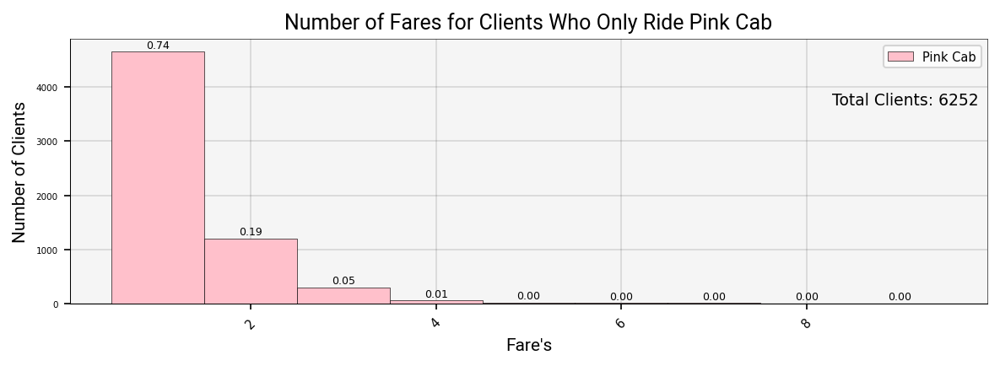

13818 Clients only rode with Yellow Cab


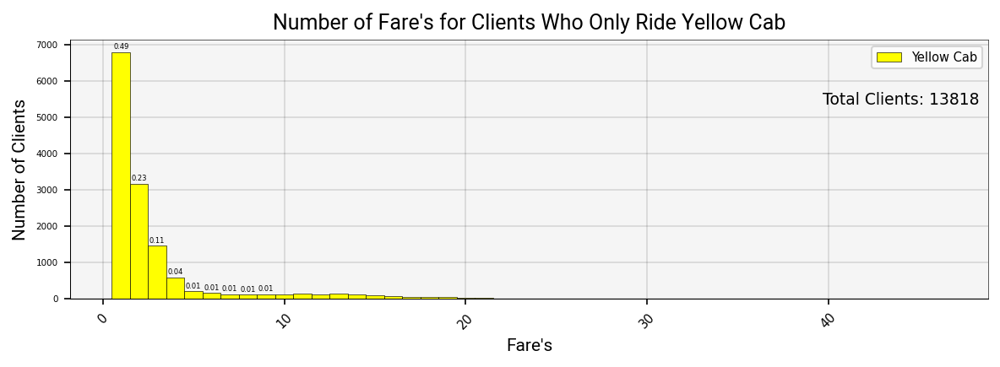

In [70]:
## > Plot: Pink Cab clients ridership, Yellow Cab ridership, Pink Cab & Yellow Cab ridership

# Create a figure with two subplots (one on top of another)
fig1, ax1 = plt.subplots(figsize=(8, 3), dpi=150)

# Number of clients for Pink Cab
n1 = len(prides_by_cust)

# Print num clients who only ride with Pink Cab
print(f'{n1} Clients only rode with Pink Cab')

# Create histogram
bins1 = np.arange(min(prides_by_cust) - 0.5, max(prides_by_cust) + 1.5, 1)
hist1, bins0, patches0 = ax1.hist(prides_by_cust, bins=bins1, color='pink', edgecolor='black', linewidth=0.3, zorder=4, label='Pink Cab')

# Format plot
bar_labels(ax1, hist1, patches0, n1)
format_plot(prides_by_cust, fig, ax1, "Fare's", 'Number of Clients', 'Number of Fares for Clients Who Only Ride Pink Cab' )
ax1.legend()

# Save the plot
fig1.savefig('pink_cab_only_ridership.png')




# Create a figure with two subplots (one on top of another)
fig2, ax2 = plt.subplots(figsize=(8, 3), dpi=150)

# Number of clients for Yellow Cab
n2 = len(yrides_by_cust)

# Print num clients who only ride with Yellow Cab
print(f'{n2} Clients only rode with Yellow Cab')

# Create histogram
bins2 = np.arange(min(yrides_by_cust) - 0.5, max(yrides_by_cust) + 1.5, 1)
hist2, bins1, patches1 = ax2.hist(yrides_by_cust, bins=bins2, color='yellow', edgecolor='black', linewidth=0.3, zorder=4, label='Yellow Cab')

# Format plot
bar_labels(ax2, hist2, patches0, n2, fontsize=4)
format_plot(yrides_by_cust, fig, ax2, "Fare's", 'Number of Clients', "Number of Fare's for Clients Who Only Ride Yellow Cab")
ax2.legend()

# Save plot
fig2.savefig('yellow_cab_only_ridership.png')

# Display both plots
plt.show()


26078 Clients rode with Pink Cab & Yellow Cab


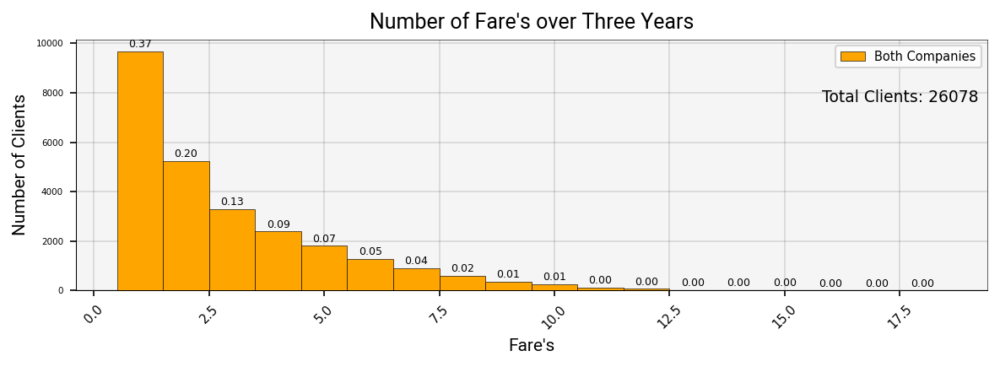

In [71]:

# Create a figure with two subplots (one on top of another)
fig3, ax3 = plt.subplots(figsize=(8, 3), dpi=150)

# Create histograms for each subplot
n3 = len(pcaby_rides_by_cust)
print(f'{n3} Clients rode with Pink Cab & Yellow Cab')
bins1 = np.arange(min(pcaby_rides_by_cust) - 0.5, max(pcaby_rides_by_cust) + 1.5, 1)
hist3, bins2, patches2 = ax3.hist(pcaby_rides_by_cust, bins=bins1, color='orange', edgecolor='black', linewidth=0.3, zorder=4, label='Both Companies')
bar_labels(ax3, hist3, patches2, n3)
format_plot(pcaby_rides_by_cust, fig3, ax3, "Fare's", 'Number of Clients', "Number of Fare's over Three Years" )

# Add legend to subplot 3
ax3.legend(['Pink Cab Riders'])

# Save the figure
fig3.savefig('p_riders_of_p_and_y_riders.png')



In [72]:
# Inferences:

# Pink Cab seems to attract more one-time users compared to Yellow Cab.
# Yellow Cab has a higher proportion of repeat users among customers who took rides exclusively with it.
# Among customers who tried both cab companies, a higher percentage of them took only 1 ride with Yellow Cab,
# which could suggest that Yellow Cab has a slightly better retention rate for these users.

In [73]:
# Avg num of trips every 3 years a client take who only rides with Yellow Cab
ynum_trips = (mdf[mdf['company'] == 'yellow cab']['cust_id'].value_counts())
print('The average client of Yellow Cab takes: ', round(np.mean(ynum_trips), 2), ' trips every three years')

The average client of Yellow Cab takes:  6.88  trips every three years


In [74]:
# Avg num of trips every 3 years a client take who only rides with Pink Cab
pnum_trips = mdf[mdf['company'] == 'pink cab']['cust_id'].value_counts()
print('The average client of Pink Cab takes: ', round(np.mean(pnum_trips), 3), ' trips every three years')

The average client of Pink Cab takes:  2.62  trips every three years


In [75]:
# Yellow cab one time customers
yone_time_cust = mdf[mdf['company']=='yellow cab']['cust_id'].value_counts().eq(1).sum()
print('Yellow Cab had:', yone_time_cust, 'one time clients over the past 3 years')

# Yellow Cab one time customers as percentage of total Yellow Cab customers
print(round(yone_time_cust/len(ynum_trips)*100, 2), '% of Yellow Cab clients were one time riders')

Yellow Cab had: 12031 one time clients over the past 3 years
30.16 % of Yellow Cab clients were one time riders


In [76]:
# Pink cab one time customers
pone_time_cust = mdf[mdf['company']== 'pink cab']['cust_id'].value_counts().eq(1).sum()
print('Pink Cab had:', pone_time_cust, 'one time clients')

# Pink Cab one time customers as percentage of total customers
print(round(pone_time_cust/len(pnum_trips)*100, 2), '% of Pink Cab clients were one time riders over the past 3 years')

Pink Cab had: 14334 one time clients
44.34 % of Pink Cab clients were one time riders over the past 3 years


## Profitability Forecast

In [77]:
# Sort date values in increasing order
mdf = mdf.sort_values(by='date').reset_index(drop=True)
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week,age_category,profit_margin
0,2016-01-02,10001340,52536,yellow cab,washington,dc,6.34,202.54,135.86,card,male,24,10606,Q1,2016,Q1-2016,66.68,saturday,18-24,0.33
1,2016-01-02,10000640,4844,yellow cab,chicago,il,9.69,374.66,209.66,cash,male,32,5548,Q1,2016,Q1-2016,165.00,saturday,25-34,0.44
2,2016-01-02,10000635,5671,yellow cab,chicago,il,15.58,532.83,337.08,cash,male,24,7081,Q1,2016,Q1-2016,195.75,saturday,18-24,0.37
3,2016-01-02,10001001,2761,yellow cab,new york,ny,29.07,1391.91,595.30,card,male,40,11462,Q1,2016,Q1-2016,796.61,saturday,35-54,0.57
4,2016-01-02,10000171,20687,pink cab,san diego,ca,8.87,269.15,147.08,cash,male,39,8926,Q1,2016,Q1-2016,122.07,saturday,35-54,0.45


In [78]:
# Set the date as the index to prepare for plotting the time series
mdf = mdf.set_index(keys='date', drop=True)
mdf.head()

,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week,age_category,profit_margin
date,,,,,,,,,,,,,,,,,,,
2016-01-02,10001340,52536,yellow cab,washington,dc,6.34,202.54,135.86,card,male,24,10606,Q1,2016,Q1-2016,66.68,saturday,18-24,0.33
2016-01-02,10000640,4844,yellow cab,chicago,il,9.69,374.66,209.66,cash,male,32,5548,Q1,2016,Q1-2016,165.00,saturday,25-34,0.44
2016-01-02,10000635,5671,yellow cab,chicago,il,15.58,532.83,337.08,cash,male,24,7081,Q1,2016,Q1-2016,195.75,saturday,18-24,0.37
2016-01-02,10001001,2761,yellow cab,new york,ny,29.07,1391.91,595.30,card,male,40,11462,Q1,2016,Q1-2016,796.61,saturday,35-54,0.57
2016-01-02,10000171,20687,pink cab,san diego,ca,8.87,269.15,147.08,cash,male,39,8926,Q1,2016,Q1-2016,122.07,saturday,35-54,0.45


In [79]:
# Group the data according to 'weekly' profits
cab_prfts = mdf.groupby(['company'], observed=True)['profit'].resample('W').agg({'profit':'sum'})
cab_costs = mdf.groupby(['company'], observed=True)['cost'].resample('W').agg({'cost': 'sum'})
cab_price = mdf.groupby(['company'], observed=True)['price'].resample('W').agg({'price': 'sum'})

# Merge the three 'weekly' profits DataFrames
df1 = pd.concat([cab_price, cab_costs, cab_prfts], axis=1)
df1.columns = ['price', 'cost', 'profit']

# Reset index of the 'weekly' profits DataFrame
df1 = df1.reset_index()

# Pivot the 'weekly' profits DataFrame
df1 = df1.pivot(index='date', columns='company')

# Flatten the column multi-index of the 'weekly' profits Dataframe
df1.columns = [' '.join(col).strip() for col in df1.columns.values]

# Re-arrange the columns of the 'weekly' profits Dataframe
mapper = {
    'price pink cab': 'pink cab price',
    'price yellow cab': 'yellow cab price',
    'cost pink cab': 'pink cab cost',
    'cost yellow cab': 'yellow cab cost',
    'profit pink cab': 'pink cab profit',
    'profit yellow cab': 'yellow cab profit'
}

# Rename 'weekly' profits Dataframe
df1.rename(mapper, axis=1, inplace=True)

# Create final 'weekly' profits Dataframe
df1 = df1[['pink cab price', 'pink cab cost', 'pink cab profit', 'yellow cab price', 'yellow cab cost', 'yellow cab profit']]
df1

,pink cab price,pink cab cost,pink cab profit,yellow cab price,yellow cab cost,yellow cab profit
date,,,,,,
2016-01-03,39233.91,23803.91,15430.00,164428.64,80683.47,83745.17
2016-01-10,71820.97,51000.81,20820.16,427712.84,238801.47,188911.37
2016-01-17,61324.72,49180.33,12144.39,456907.78,267146.60,189761.18
2016-01-24,69741.81,58110.49,11631.32,420788.75,251243.77,169544.98
2016-01-31,63115.36,49188.38,13926.98,482311.75,277966.34,204345.41
...,...,...,...,...,...,...
2018-12-09,268486.35,209040.37,59445.98,1117562.26,775782.56,341779.70
2018-12-16,297305.44,227956.45,69348.99,1251959.33,870710.88,381248.45
2018-12-23,299698.05,230114.03,69584.02,1257508.53,852730.29,404778.24


In [80]:
## > Plotting weekly profits time series data with Plotly

# Define quarter lines
quarter_lines = [
    
    
    {'x0': '2016-04-01', 'x1': '2016-04-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2016-07-01', 'x1': '2016-07-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2016-10-01', 'x1': '2016-10-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-01-01', 'x1': '2017-01-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-04-01', 'x1': '2017-04-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-07-01', 'x1': '2017-07-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-10-01', 'x1': '2017-10-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-01-01', 'x1': '2018-01-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-04-01', 'x1': '2018-04-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-07-01', 'x1': '2018-07-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-10-01', 'x1': '2018-10-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'}
]

quarter_labels = ['Q2', 'Q3', 'Q4', 'Q1', 'Q2', 'Q3', 'Q4', 'Q1', 'Q2', 'Q3']


# Define colors for the traces
colors = ['hotpink', 'hotpink', 'lightsteelblue', 'yellow', 'yellow', 'lightsteelblue']
labels = ['Price: top', 'Cost: bottom', 'Profit:blue area', 'Price: top', 'Cost: bottom', 'Profit:blue area']


shapes = [
    dict(
        type='line',
        xref='x',
        yref='paper',
        x0=line['x0'],
        x1=line['x1'],
        y0=0,
        y1=1,
        line_width=line['line_width'],
        line_dash=line['line_dash'],
    ) for line in quarter_lines
]


annotations = [
    dict(
        x=line['x0'],
        y=1.05,
        xref='x',
        yref='paper',
        text=label,
        showarrow=False,
        font=dict(size=10),
    ) for line, label in zip(quarter_lines, quarter_labels)
]

font_style = {'family': 'Roboto', 'size': 12}

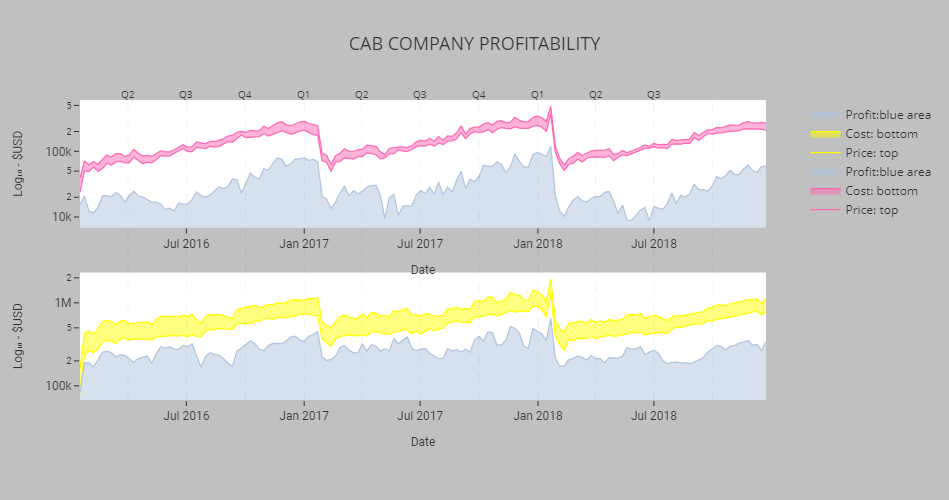

In [81]:

# Create a subplot with two rows and one column
fig = make_subplots(rows=2, cols=1, shared_xaxes=False)


# Add multiple time series traces to the first subplot (row 1)

for i in range(0, 3):
    if i == 1:
        fill='tonexty'
    elif i == 2:
        fill='tozeroy'
    else:
        fill='none'
        
    column_name = df1.columns[i]
    
    trace = go.Scatter(x=df1.index[2:-2], 
                       y=df1[column_name], 
                       mode='lines', 
                       name=f'{labels[i]}', 
                       line={'width': 1.25, 'color': colors[i]},
                       fill=fill,
                       showlegend=True)
    
    fig.add_trace(trace, row=1, col=1)
    
# Add multiple time series traces to the second subplot (row 2)
for i in range(3, 6):
    if i == 4:
        fill='tonexty'
    elif i == 5:
        fill='tozeroy'
    else:
        fill='none'
    
    column_name = df1.columns[i]
    
    trace = go.Scatter(x=df1.index[2:-2], 
                       y=df1[column_name], 
                       mode='lines', 
                       name=f'{labels[i]}', 
                       line={'width': 1.25, 'color': colors[i]},
                       fill=fill,
                       showlegend=True)
    
    fig.add_trace(trace, row=2, col=1)
    

# Customize the layout
fig.update_layout(
    title='CAB COMPANY PROFITABILITY',
    title_font_size=18,
    xaxis_title='Date',
    template="ggplot2",
    showlegend=True,  
    legend=dict(x=1.25, xanchor='right', y=1, yanchor='top'),
    margin=dict(t=100, b=100),  
    height=500,  
    width=800,   
    shapes=shapes,
    annotations=annotations,
    plot_bgcolor='white', 
    paper_bgcolor='silver'  
)


# Update properties for the second subplot (row 2)
fig.update_xaxes(title_text='Date', row=1, col=1, title_font=font_style, tickfont=font_style, showgrid=False)
fig.update_yaxes(type='log', row=1, col=1, title_text='Log₁₀ - $USD', title_font=font_style, tickfont=font_style, 
                 showgrid=False)
fig.update_xaxes( title_text='Date', row=2, col=1,title_font=font_style, tickfont=font_style, showgrid=False)
fig.update_yaxes(type='log', row=2, col=1, title_text='Log₁₀ - $USD', title_font=font_style, tickfont=font_style, 
                 showgrid=False)

# Show the plot
fig.show()


## Forecasting Profits: Time-Series

In [82]:
# Aggregate time series 'weekly' profits data
profit_series = mdf.groupby('company', observed=True)['profit'].resample('W').sum()
profit_df = profit_series.unstack(level='company')

# Separate individual series for easier coding and identification
pprofits = profit_df['pink cab']
yprofits = profit_df['yellow cab']


## Time Series Decomposition: Identifying Seasonal & Overall Trend

In [83]:
# Decompose the time series for both Pink Cab & Yellow Cab

pdecomp = sm.tsa.seasonal_decompose(pprofits, model='additive', period=52, filt=None,
                                    two_sided=True, extrapolate_trend='freq')

ydecomp = sm.tsa.seasonal_decompose(yprofits, model='additive', period=52, filt=None, 
                                   two_sided=True, extrapolate_trend='freq')

# Drop all null values
ptrend = pdecomp.trend.dropna()
pseasonal = pdecomp.seasonal.dropna()
presiduals = pdecomp.resid.dropna()

ytrend = ydecomp.trend.dropna()
yseasonal = ydecomp.seasonal.dropna()
yresiduals = ydecomp.resid.dropna()


In [84]:
# Function to format plots similarly
def format_plot(data, fig, ax, xlab, ylab, title, facecolor):
    
    # Set font size
    plt.yticks(fontsize=5)

    # Set labels and title
    ax.set_xlabel(xlab, fontproperties=roboto, fontsize=10)
    
    #ax.set_xticks(np.arange(min(data), max(data) + 1), fontsize=7, fontproperties=roboto)
    ax.set_ylabel(ylab, fontproperties=roboto, fontsize=10)
    ax.set_title(f'{title}', fontproperties=roboto, fontsize=12)
    
    ax.tick_params(axis='x', labelrotation=45, labelsize=7)

    ax.spines['left'].set_linewidth(.5)
    ax.spines['bottom'].set_linewidth(.5)
    ax.spines['top'].set_linewidth(.3)
    ax.spines['right'].set_linewidth(.3)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1, 1), prop={'size': 7})

    # Set ax facecolor
    ax = plt.gca()
    ax.set_facecolor('white')

    # Set the figure face color
    fig.set_facecolor(facecolor)

   
    # Set the color of the plot perimeter (spines)
    perimeter_color = 'black'  # Set the desired perimeter color
    ax.spines['top'].set_color(perimeter_color)
    ax.spines['right'].set_color(perimeter_color)
    ax.spines['bottom'].set_color(perimeter_color)
    ax.spines['left'].set_color(perimeter_color)

    # Display the plot
    plt.tight_layout()
    plt.grid(True, linewidth=.1, color='black')
    plt.tight_layout()
  

In [85]:
pink_colors = ['#ff87a0', '#e65c75', '#d93c53', '#c1223d', '#ff6699', '#ff4d6a', '#ff3350', '#ff1a37',
               '#ffcccc', '#ff9999', '#ff6666', '#ff3333', '#ffb3b3', '#ff8080', '#ff4d4d', '#ff1a1a',
               '#ffd9d9', '#ffad99', '#ff8066', '#ff5533', '#ffe0cc', '#ffb299', '#ff804d', '#ff4d00']

yellow_colors = ['#ffeb88', '#ffd43f', '#ffcc00', '#ffaa00', '#ffff99', '#ffff66', '#ffff33', '#ffff00',
                 '#ffffcc', '#ffff99', '#ffff66', '#ffff33', '#ffcc00', '#ffaa00', '#ff8800', '#ff6600',
                 '#fff2cc', '#ffe699', '#ffdd66', '#ffcc33', '#fff5cc', '#fff0b3', '#ffeb99', '#ffe580']


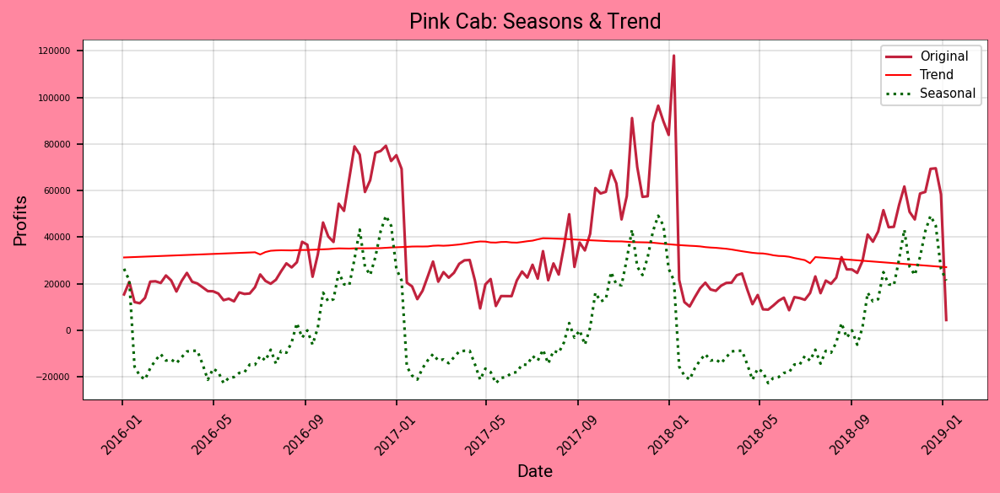

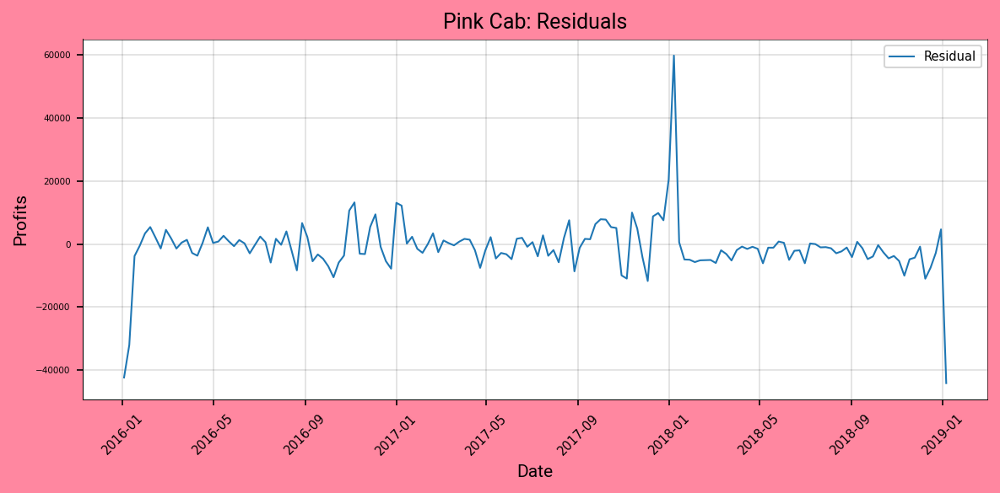

In [86]:
## > Pink seasonal decomposition

fig3, ax3 = plt.subplots(figsize=(8, 4), dpi=150)

# Overlay the decomp trends on same plot
ax3.plot(pprofits, label='Original', linewidth=1.5, color='#c1223d')
ax3.plot(pprofits.index, ptrend, label='Trend', linestyle='solid', linewidth=1, color='red')
ax3.plot(pprofits.index, pseasonal, label='Seasonal', linestyle='dotted', linewidth=1.5, color='darkgreen')

# Format the plot
format_plot(pprofits, fig3, ax3, 'Date', 'Profits', 'Pink Cab: Seasons & Trend', '#ff87a0')




fig4, ax4 = plt.subplots(figsize=(8, 4), dpi=150)

# Residuals from Pink Cab
ax4.plot(pprofits.index, presiduals, label='Residual', linewidth=1)
format_plot(pprofits, fig4, ax4, 'Date', 'Profits', 'Pink Cab: Residuals', '#ff87a0')

fig3.savefig('pink_profit_trend.png')


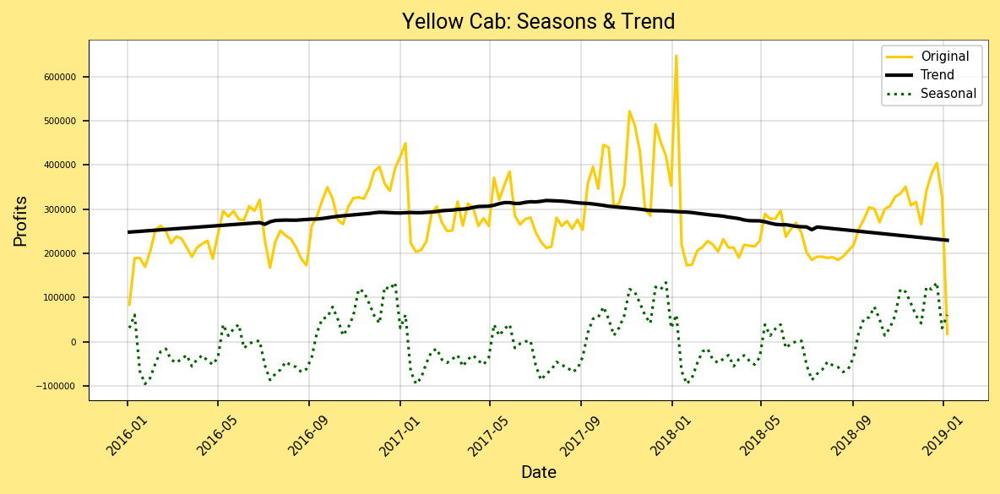

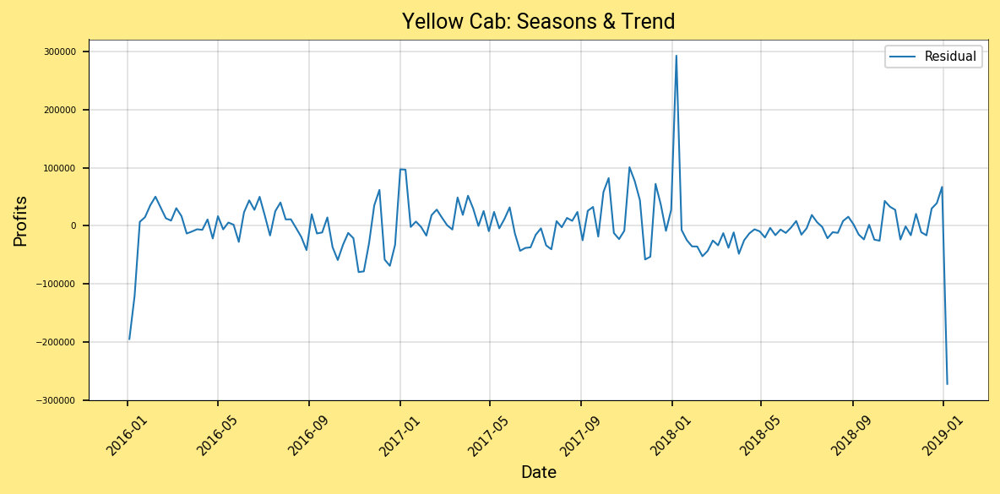

In [87]:

# ## > Yellow seasonal decomposition

fig5, ax5 = plt.subplots(figsize=(8, 4), dpi=150)

# Overlay the Yellow Cab decomp trends on same plot 
ax5.plot(yprofits, label='Original', linewidth=1.5, color='#ffcc00')
ax5.plot(yprofits.index, ytrend, label='Trend', linestyle='solid', linewidth=2, color='black')
ax5.plot(yprofits.index, yseasonal, label='Seasonal', linestyle='dotted', linewidth=1.5, color='darkgreen')

# Format the plot
format_plot(yprofits, fig5, ax5, 'Date', 'Profits', 'Yellow Cab: Seasons & Trend', '#ffeb88')

fig6, ax6 = plt.subplots(figsize=(8, 4), dpi=150)

# Decomp residuals for Yellow Cab
ax6.plot(yprofits.index, yresiduals, label='Residual', linewidth=1)
format_plot(yprofits, fig6, ax6, 'Date', 'Profits', 'Yellow Cab: Seasons & Trend', '#ffeb88')

fig5.savefig('yellow_profit_trend.png')

## Estimating Pink Cab Trend Coefficients

In [88]:
# Add a constant term to the independent variable (trend)
X = sm.add_constant(ptrend)

# Fit a linear regression model
model = sm.OLS(pprofits, X)
results = model.fit()

# Get the regression coefficients
intercept, slope = results.params

# Print the coefficients
print("Intercept:", intercept)
print("Slope (Coefficient):", slope, '\n')

# R-squared
print(f'R-Squared: {results.rsquared} ')

Intercept: 74.27790462070152
Slope (Coefficient): 0.9770054376728574 

R-Squared: 0.019667358849381422 


A, B, C = [-1.56745539e+00  2.26683728e+02  2.94303202e+04]

R-squared: 0.8969648915122492


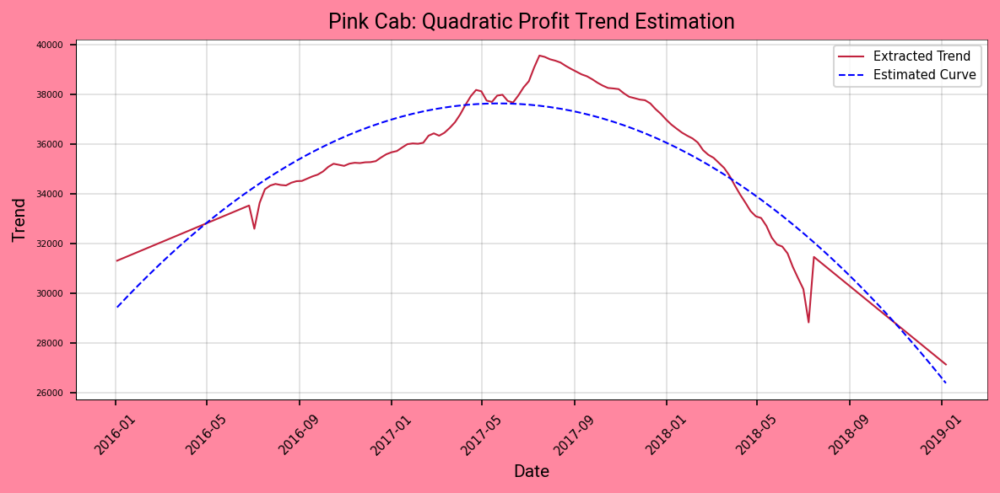

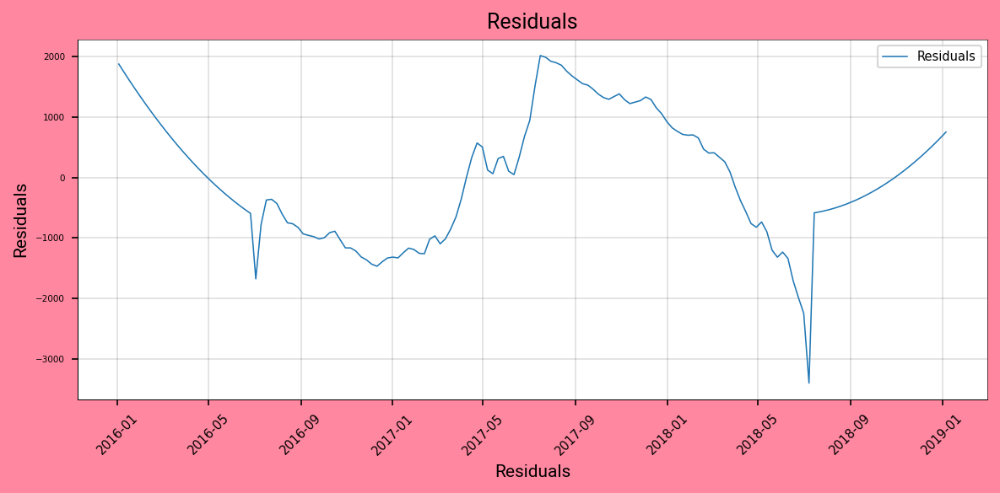

In [89]:
from scipy.optimize import curve_fit

# Convert DatetimeIndex to numerical values
x_values = np.arange(len(ptrend))


# Define the quadratic function
def quadratic_func(x, a, b, c):
    return a * x**2 + b * x + c

# Fit the quadratic function to the numerical x_values using scipy.optimize.curve_fit
params, _= curve_fit(quadratic_func, x_values, ptrend)

# Generate the values of the quadratic curve
quadratic_curve = quadratic_func(x_values, *params)

# Calculate residuals (differences between original data and fitted curve)
pquad_resid = ptrend - quadratic_curve



# Plot the original data and the quadratic curve
fig6, ax6 = plt.subplots(figsize=(8, 4), dpi=150)

ax6.plot(ptrend.index, ptrend, label='Extracted Trend', linewidth=1, color='#c1223d')
ax6.plot(ptrend.index, quadratic_curve, label='Estimated Curve', linestyle='dashed', linewidth=1, color='blue')
format_plot(ptrend, fig6, ax6, 'Date', 'Trend', 'Pink Cab: Quadratic Profit Trend Estimation', '#ff87a0')

fig6.savefig('pink_quadratic trend.png')
print(f'A, B, C = {params}')



fig7, ax7 = plt.subplots(figsize=(8, 4), dpi=150)

plt.plot(ptrend.index, pquad_resid, label='Residuals', linewidth=.75)
format_plot(ptrend, fig7, ax7, 'Residuals', 'Residuals', 'Residuals', '#ff87a0')

# Calculate R-Squared value
sst = np.sum((ptrend - np.mean(ptrend))**2)
ssr = np.sum(pquad_resid**2)
r_squared = 1 - (ssr / sst)
print("\nR-squared:", r_squared)


## Estimating Yellow Cab Trend Coefficients

In [90]:
# Add a constant term to the independent variable (trend)
X = sm.add_constant(ytrend)

# Fit a linear regression model
model = sm.OLS(yprofits, X)
results = model.fit()

# Get the regression coefficients
intercept, slope = results.params

# Print the coefficients
print("Intercept:", intercept)
print("Slope (Coefficient):", slope, '\n')

# R-squared
print(f'R-Squared: {results.rsquared} ')


Intercept: -4625.076291150166
Slope (Coefficient): 1.0150681777374322 

R-Squared: 0.08846372701925453 


A, B, C = [-1.22501789e+01  1.83046549e+03  2.36311110e+05]
R-squared: 0.9993092410489578


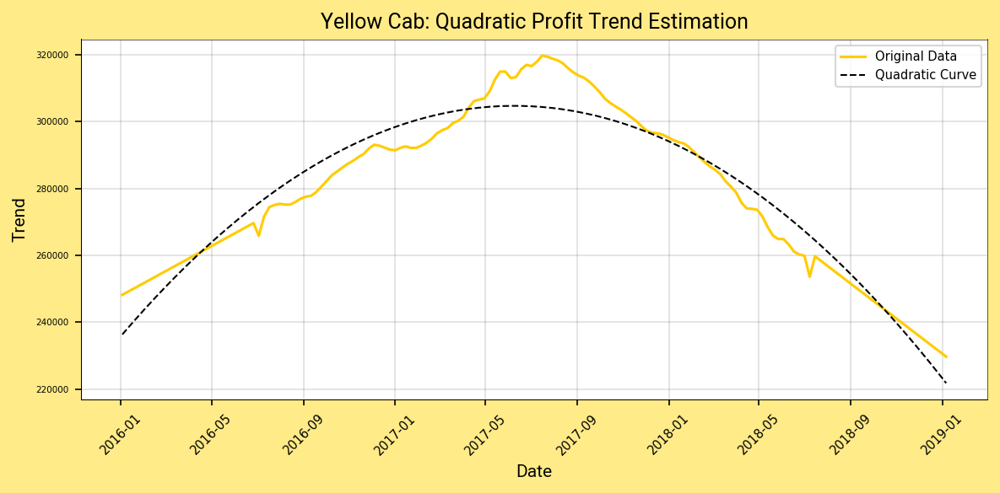

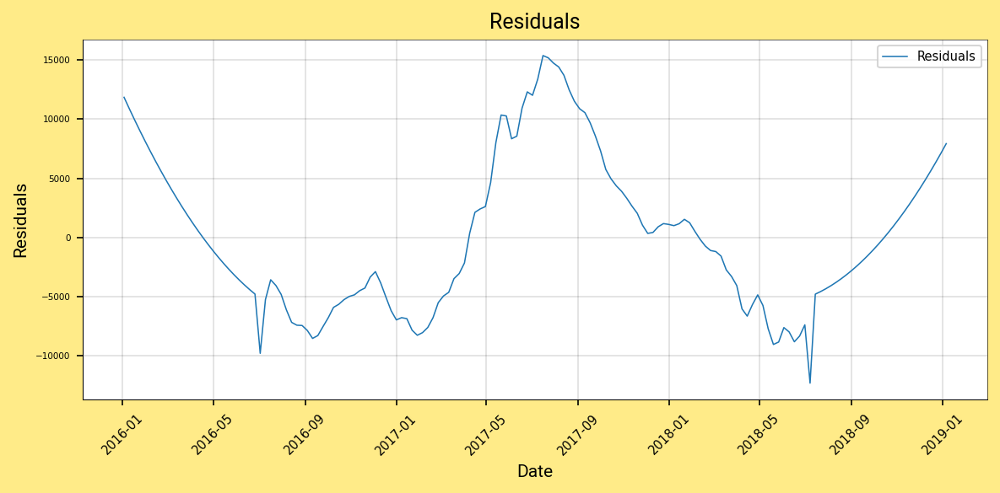

In [91]:
from scipy.optimize import curve_fit

# Convert DatetimeIndex to numerical values
x_values = np.arange(len(ytrend))


# Define the quadratic function
def quadratic_func(x, a, b, c):
    return a * x**2 + b * x + c

# Fit the quadratic function to the numerical x_values using scipy.optimize.curve_fit
params, _= curve_fit(quadratic_func, x_values, ytrend)

# Generate the values of the quadratic curve
quadratic_curve = quadratic_func(x_values, *params)

# Calculate residuals (differences between ytrend data and fitted curve)
yquad_resid = ytrend - quadratic_curve


# Create figure
fig8, ax8 = plt.subplots(figsize=(8, 4), dpi=150)


plt.plot(ytrend.index, ytrend, label='Original Data', linewidth=1.5, color='#ffcc00')
plt.plot(ytrend.index, quadratic_curve, label='Quadratic Curve', linestyle='dashed', linewidth=1, color='black')
format_plot(ytrend, fig8, ax8, 'Date', 'Trend', 'Yellow Cab: Quadratic Profit Trend Estimation', '#ffeb88')

fig8.savefig('yellow_quaratic_trend.png')
# Print parameters
print(f'A, B, C = {params}')

fig9, ax9 = plt.subplots(figsize=(8, 4), dpi=150)

# Plot the residuals from the curve fitting
plt.plot(ytrend.index, yquad_resid, label='Residuals', linewidth=.75)
format_plot(ytrend, fig9, ax9, 'Date', 'Residuals', 'Residuals', '#ffeb88')

# Calculate R-Squared value
sst = np.sum((ytrend - np.mean(ptrend))**2)
ssr = np.sum(yquad_resid**2)
r_squared = 1 - (ssr / sst)
print("R-squared:", r_squared)

# Stationarity

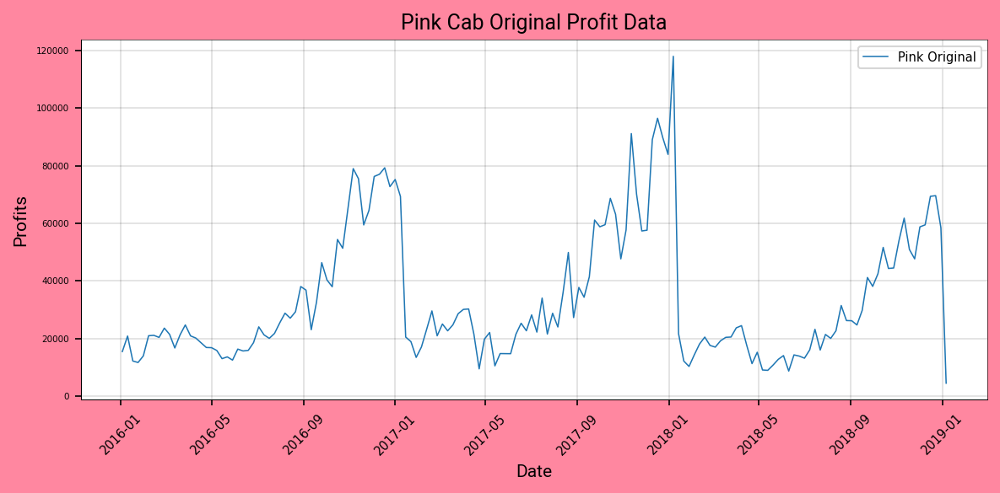

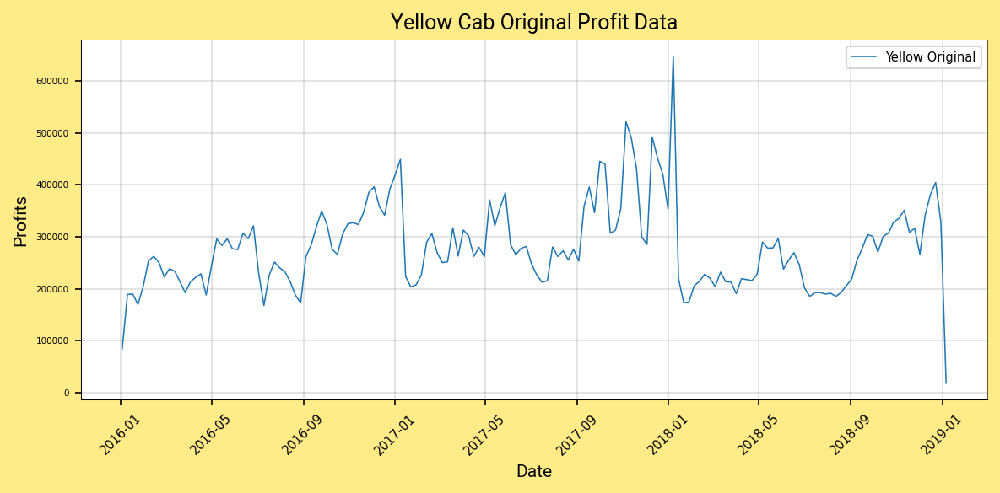

In [92]:
# Plot figure
fig10, ax10 = plt.subplots(figsize=(8, 4), dpi=150)

# Plot Pink Cab original 'weekly' profits data
plt.plot(pprofits, label='Pink Original', linewidth=.75)
format_plot(pprofits, fig10, ax10, 'Date', 'Profits', 'Pink Cab Original Profit Data', '#ff87a0')

fig11, ax11 = plt.subplots(figsize=(8, 4), dpi=150)

# Plot Yellow Cab original 'weekly' profits data
plt.plot(yprofits, label='Yellow Original', linewidth=.75)
format_plot(yprofits, fig11, ax11, 'Date', 'Profits', 'Yellow Cab Original Profit Data', '#ffeb88')

## Pink Cab Stationarity: First Order & Seasonal Differencing, & ADF Test

In [93]:
# Fit the rolling mean & standard deviations to Pink Cab profit data
window_size = 12

pmove_avg = pprofits.rolling(window=window_size, min_periods=1).mean()
pmove_std = pprofits.rolling(window=window_size, min_periods=1).std()

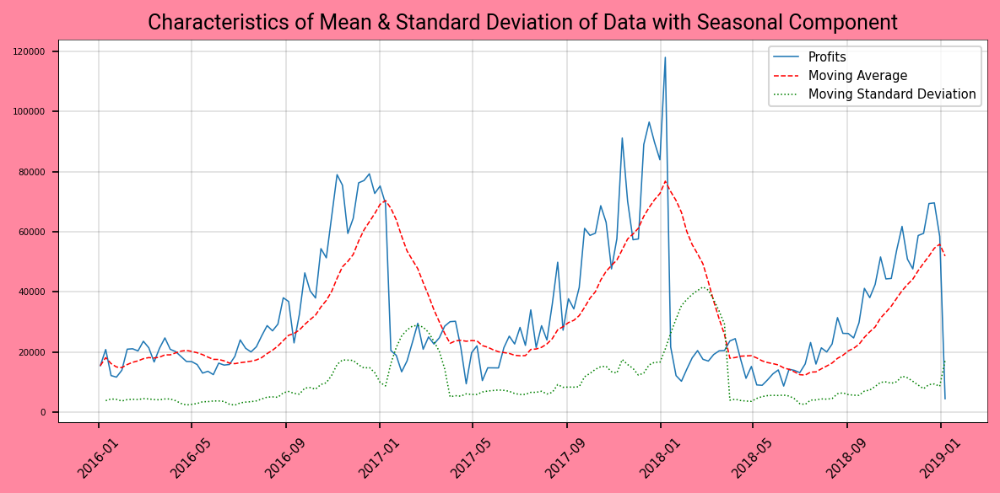

In [94]:
fig12, ax12 = plt.subplots(figsize=(8, 4), dpi=150)

# Plot rolling mean & stdv for Pink Cab
plt.plot(pprofits, label='Profits', linewidth=.75)
plt.plot(pprofits.index, pmove_avg, label='Moving Average', linestyle='dashed', color='red', linewidth=.75)
plt.plot(pprofits.index, pmove_std, label='Moving Standard Deviation', linestyle='dotted', color='green', linewidth=.75)
format_plot(pprofits, fig12, ax12, '', '', 'Characteristics of Mean & Standard Deviation of Data with Seasonal Component', '#ff87a0')


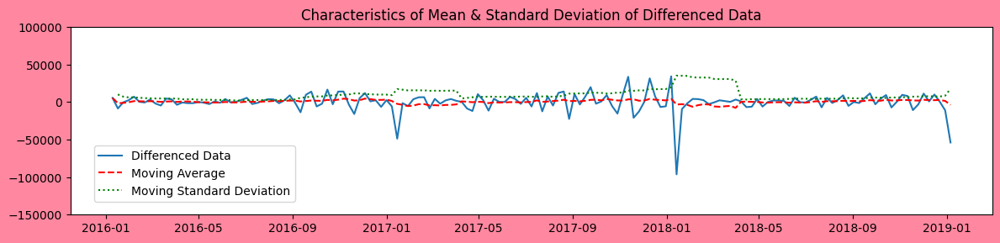

In [95]:
# Take the first difference to remove any trend component
pprofits_diff = pprofits.diff().dropna()


# Fit the rolling avg & std
pmove_avg = pprofits_diff.rolling(window=window_size, min_periods=1).mean()
pmove_std = pprofits_diff.rolling(window=window_size, min_periods=1).std()

plt.figure(figsize=(12, 8), facecolor='#ff87a0')
plt.subplot(3, 1, 1)
plt.plot(pprofits_diff, label='Differenced Data')
plt.ylim(-150000, 100000)
plt.plot(pprofits_diff.index, pmove_avg, label='Moving Average', linestyle='dashed', color='red')
plt.plot(pprofits_diff.index, pmove_std, label='Moving Standard Deviation', linestyle='dotted', color='green')
plt.title('Characteristics of Mean & Standard Deviation of Differenced Data')
plt.tight_layout()
plt.legend(bbox_to_anchor=(.25, .4))


In [96]:
# Perform Adfuller ADF test for stationarity

# H0: has a unit root, non-stationary
# Ha: no unit root, is stationary (trend stationary)

adf_test1 = adfuller(pprofits_diff)

print('\nADF Statistic:', adf_test1[0])
print('p-value:', adf_test1[1], '\n')
print('Reject the null, data is stationary for weekly pink cab data\n ')




ADF Statistic: -9.955501029382452
p-value: 2.45041191882047e-17 

Reject the null, data is stationary for weekly pink cab data
 


## Pink Cab Profit Forecast: Seasonal ARIMA

In [97]:
# Aggregate data for Pink Cab
profit_series = mdf.groupby('company', observed=True)['profit'].resample('W').sum()
profit_df = profit_series.unstack(level='company')

# Separate individual series for easier coding and identification
pprofits = profit_df['pink cab']


In [98]:
forecast1=None
del forecast1

transformer1=None
del transformer1

forecast=None
del forecast

transformer=None
del transformer

In [99]:
from scalecast.Forecaster import Forecaster
from scalecast.SeriesTransformer import SeriesTransformer


# Create forecast object from scalecast
forecast1 = Forecaster(
    current_dates = pprofits.index,
    y = pprofits,
    future_dates = 104,
)


This ACF plot shows us that as the lagged value increases the correlation between an observation and its lagged value decreases



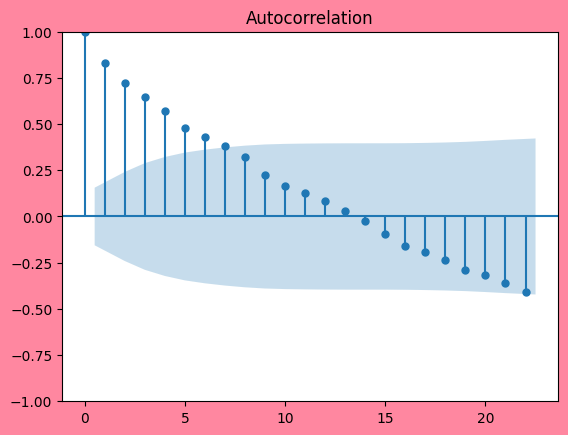

In [100]:
# Plot the ACF 
forecast1.plot_acf().set_facecolor('#ff87a0')
print('This ACF plot shows us that as the lagged value increases the correlation between an observation and its '
      'lagged value decreases\n')

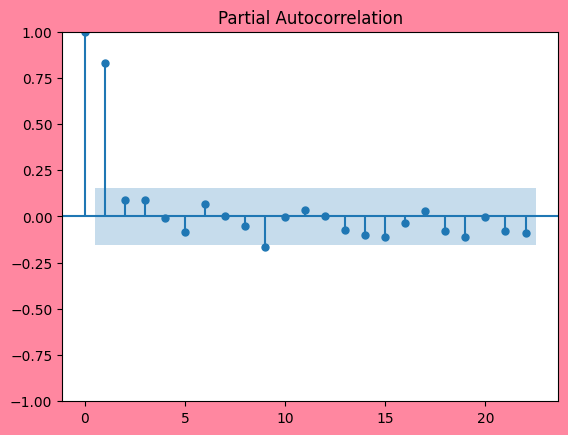

In [101]:
# Plot the PACF
forecast1.plot_pacf(method='ywm').set_facecolor('#ff87a0')

We can clearly see the seasonal trend separated from it's global negative quadratic trend



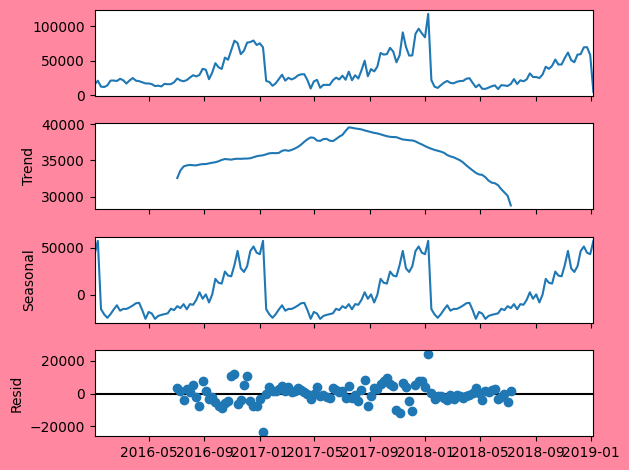

In [102]:
forecast1.seasonal_decompose().plot().set_facecolor('#ff87a0')
print("We can clearly see the seasonal trend separated from it's global negative quadratic trend\n")
plt.show()

In [103]:
# Create a transformer object
transformer1 = SeriesTransformer(forecast1)

# Take the 52 week difference
forecast1 = transformer1.DiffTransform(52)

# Detrend the data
forecast1 = transformer1.DetrendTransform()

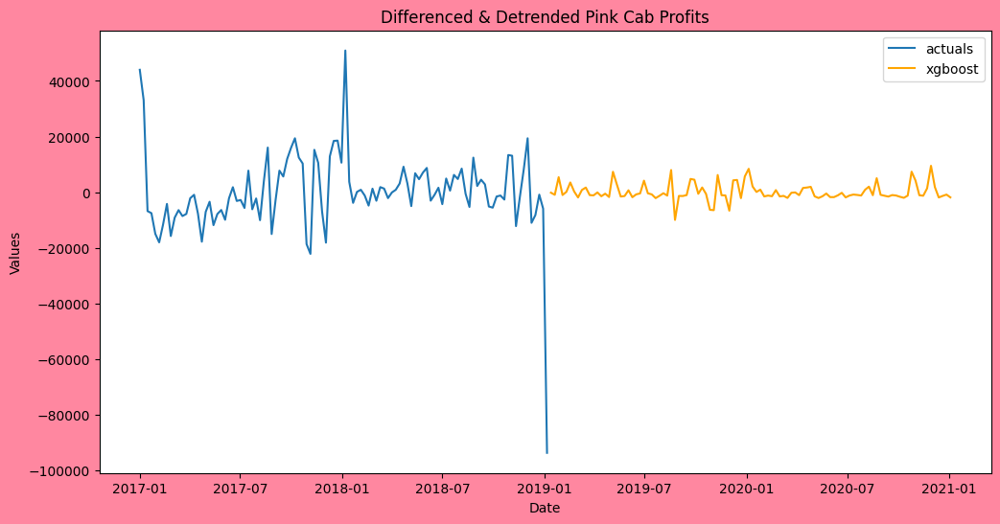

In [104]:
# Set the estimator, and autoregressive terms
forecast1.set_estimator('xgboost')
forecast1.add_ar_terms(54)
forecast1.manual_forecast(n_estimators=100, gamma=2)
forecast1.plot().set_title('Differenced & Detrended Pink Cab Profits')
plt.gcf().set_facecolor('#ff87a0')


In [105]:
# Revert the transformations on the data
forecast1 = transformer1.DetrendRevert()
forecast1 = transformer1.DiffRevert(52)


/tmp/ipykernel_4411/3693980104.py:22: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



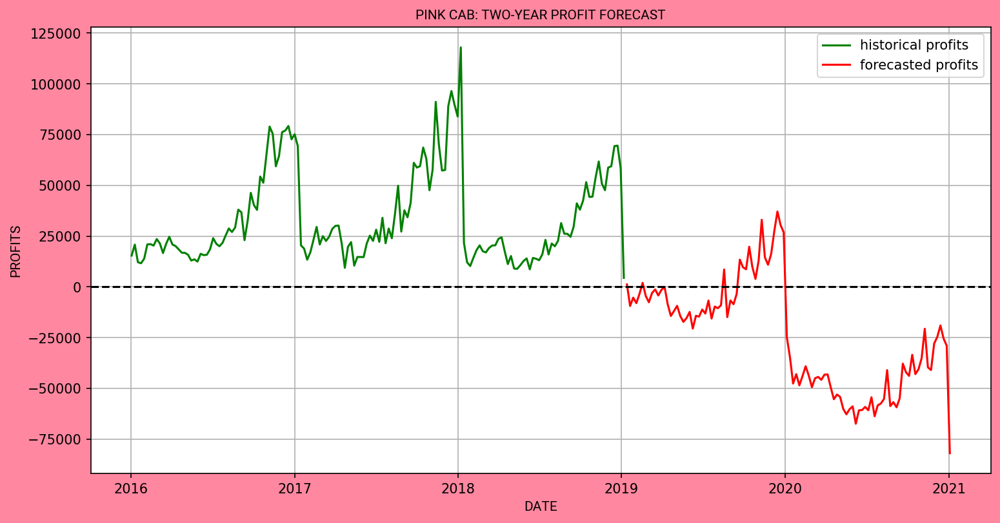

In [106]:
# pink: '#ff87a0'
# yellow: '#ffff66'

# Plot the forecast
forecast1_plot = forecast1.plot()
forecast1_plot.set_title('PINK CAB: TWO-YEAR PROFIT FORECAST', fontsize=14, fontproperties=roboto)


# Set DPI (dots per inch)
forecast1_plot.get_figure().set_dpi(150)
forecast1_plot.get_figure().set_facecolor('bisque')


# Modify the size of the axis and figure
forecast1_plot.set_facecolor('white')  
forecast1_plot.set_xlabel('DATE', fontsize=10, fontproperties=roboto)
forecast1_plot.set_ylabel('PROFITS', fontsize=10, fontproperties=roboto)
forecast1_plot.grid(True)
legend = forecast1_plot.legend()

# Change handle names
for line, handle in zip(forecast1_plot.get_lines(), legend.legendHandles):
    if line.get_label() == 'actuals': 
        line.set_color('green')
        handle.set_color(line.get_color())
    elif line.get_label() == 'xgboost':
        line.set_color('red')
        handle.set_color(line.get_color())

# Plot the zero profit line
plt.axhline(y=0, linestyle='--', linewidth=1.5, color='black')

# Update the legend labels
new_labels = ['historical profits', 'forecasted profits']
for text, label in zip(legend.get_texts(), new_labels):
    text.set_text(label)
        
# Show the modified chart
plt.gcf().set_facecolor('#ff87a0')
plt.show()

# Save figure
forecast1_plot.get_figure().savefig('pink_forecast.png')

## Yellow Cab Stationarity: First Order & Seasonal Differencing, & ADF Test

In [107]:
# Fit the rolling mean & standard deviations of Yellow Cab profits
ymove_avg = yprofits.rolling(window=window_size, min_periods=1).mean()
ymove_std = yprofits.rolling(window=window_size, min_periods=1).std()

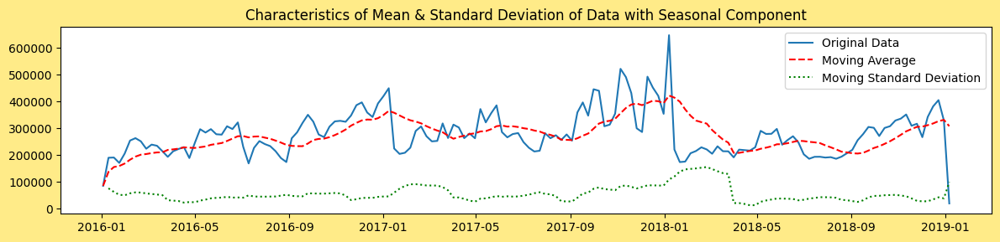

In [108]:

# Plot the moving averages
plt.figure(figsize=(12, 8)).set_facecolor('#ffeb88')
plt.subplot(3, 1, 1)
plt.plot(yprofits, label='Original Data')
plt.plot(yprofits.index, ymove_avg, label='Moving Average', linestyle='dashed', color='red')
plt.plot(yprofits.index, ymove_std, label='Moving Standard Deviation', linestyle='dotted', color='green')
plt.title('Characteristics of Mean & Standard Deviation of Data with Seasonal Component')
plt.tight_layout()
plt.legend()


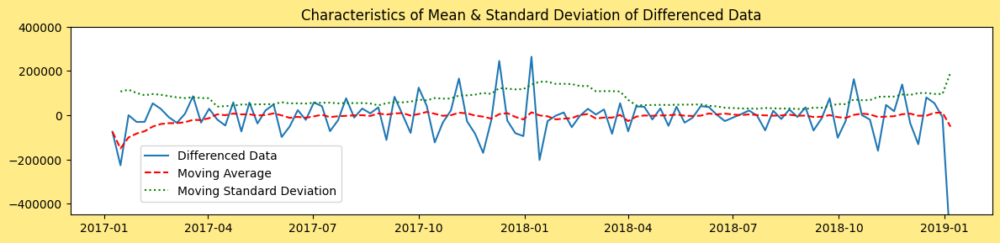

In [109]:
# Take the first difference of Yellow Cab data
yprofits_diff = yprofits.diff().dropna()

# Takd the 52-week seasonal difference to remove the seasonal component
yprofits_diff = yprofits_diff.diff(52).dropna()

# Fit the rolling avg & std
ymove_avg = yprofits_diff.rolling(window=window_size, min_periods=1).mean()
ymove_std = yprofits_diff.rolling(window=window_size, min_periods=1).std()

# Plot the moving averages and data
plt.figure(figsize=(12, 8)).set_facecolor('#ffeb88')
plt.subplot(3, 1, 1)
plt.plot(yprofits_diff, label='Differenced Data')
plt.ylim(-450000, 400000)
plt.plot(yprofits_diff.index, ymove_avg, label='Moving Average', linestyle='dashed', color='red')
plt.plot(yprofits_diff.index, ymove_std, label='Moving Standard Deviation', linestyle='dotted', color='green')
plt.title('Characteristics of Mean & Standard Deviation of Differenced Data')
plt.tight_layout()
plt.legend(bbox_to_anchor=(0.3, 0.4))


In [110]:
# Perform Adfuller ADF test for stationarity

# H0: has a unit root, non-stationary
# Ha: no unit root, is stationary (trend stationary)

adf_test1 = adfuller(yprofits_diff)

print('\nADF Statistic:', adf_test1[0])
print('p-value:', adf_test1[1], '\n')
print('Reject the null, data is stationary for weekly yellow cab data\n ')



ADF Statistic: -5.067287920680111
p-value: 1.6305208904158085e-05 

Reject the null, data is stationary for weekly yellow cab data
 


## Yellow Cab Profit Forecast: Seasonal ARIMA 

In [111]:
# Aggregate 'weekly' profits data for Yellow Cab
profit_series = mdf.groupby('company', observed=True)['profit'].resample('W').sum()
profit_df = profit_series.unstack(level='company')

# Separate individual series for easier coding and identification
yprofits = profit_df['yellow cab']


In [112]:
forecast2=None
del forecast2

transformer2=None
del transformer2

In [113]:
from scalecast.Forecaster import Forecaster
from scalecast.SeriesTransformer import SeriesTransformer


# Create forecast object
forecast2 = Forecaster(
    current_dates = yprofits.index,
    y = yprofits,
    future_dates = 104,
)


We can clearly see the same negative relationship that Pink Cab has in its ACF plot However, this plot suggest that Yellow Cab profits might be a bit harder to predict


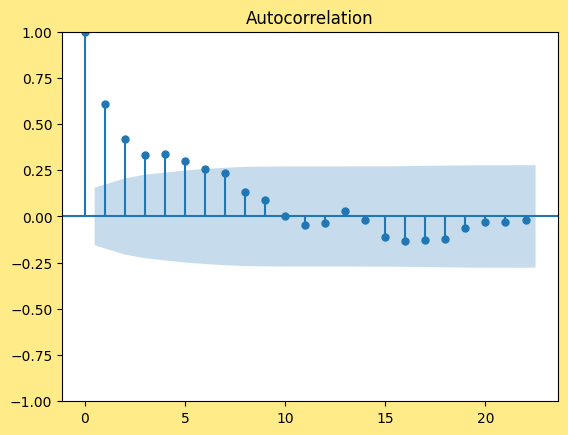

In [114]:
# Plot the ACF
forecast2.plot_acf().set_facecolor('#ffeb88')
print('We can clearly see the same negative relationship that Pink Cab has in its ACF plot '
      'However, this plot suggest that Yellow Cab profits might be a bit harder to predict')

The good news is that we see here the same significant spike at lag1



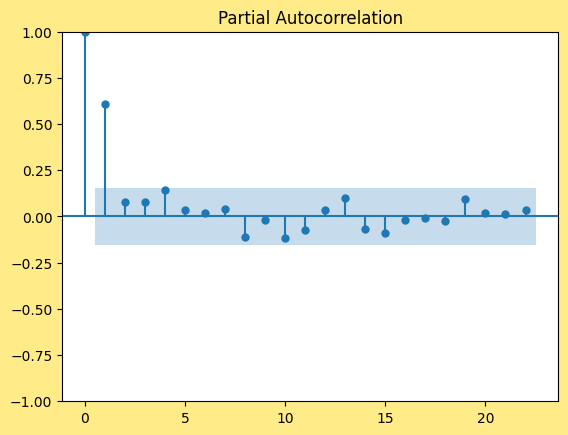

In [115]:
# Plot the PACF of Yellow Cab 'weekly' profits data
forecast2.plot_pacf(method='ywm').set_facecolor('#ffeb88')
print('The good news is that we see here the same significant spike at lag1\n')

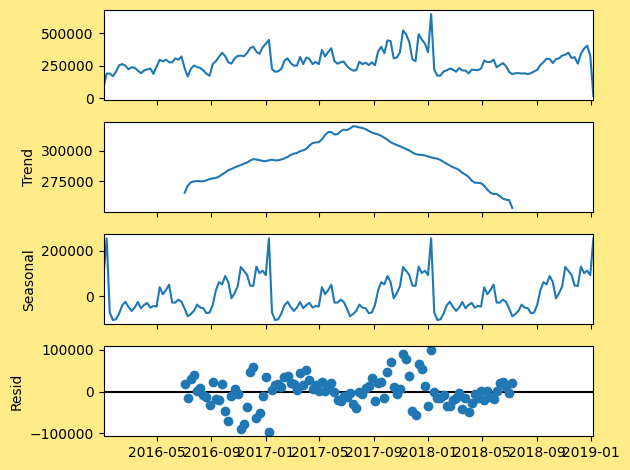

We can clearly see that Yellow Cab shares the same global seasons and strong negative quadratic trend



In [116]:
# Plot seasonal decomposition using Scalecast libray to confirm the TSA library results

forecast2.seasonal_decompose().plot().set_facecolor('#ffeb88')
plt.show()

print('We can clearly see that Yellow Cab shares the same global seasons and strong negative quadratic trend\n')

In [117]:
# Create a transformer object
transformer2 = SeriesTransformer(forecast2)

# Take the seasonal difference to rid data of seasonality
forecast2 = transformer2.DiffTransform(52) 

# Detrend the data
forecast2 = transformer2.DetrendTransform()

In [118]:
# Set the algorithm we will use to make a prediction
forecast2.set_estimator('xgboost')

# Set the number of auto-regressive terms
forecast2.add_ar_terms(52)

# Perform the forecast
forecast2.manual_forecast(n_estimators=100, gamma=2)


In [119]:

# Revert the detrending (must be first[opposite order])
forecast2 = transformer2.DetrendRevert()

# Revert the difference to get return the seasonality
forecast2 = transformer2.DiffRevert(52)


/tmp/ipykernel_4411/988766092.py:12: MatplotlibDeprecationWarning:

The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.



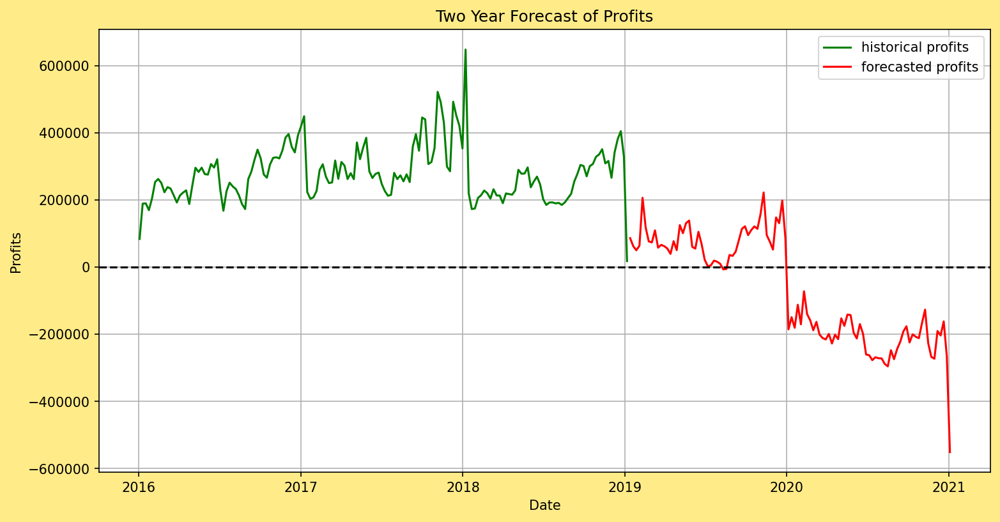

In [120]:

# Configure plot of forecast
forecast2_plot = forecast2.plot()
forecast2_plot.get_figure().set_dpi(150)
forecast2_plot.set(xlabel='Date', ylabel='Profits', title='Two Year Forecast of Profits')

forecast2_plot.grid(True)

# Configure legend
legend = forecast2_plot.legend()

# Change the color of profit lines
for line, handle in zip(forecast2_plot.get_lines(), legend.legendHandles):
    if line.get_label() == 'actuals':
        line.set_color('green')
        handle.set_color(line.get_color())
    elif line.get_label() == 'xgboost':
        line.set_color('red')
        handle.set_color(line.get_color())
        
# Update the legend labels
new_labels = ['historical profits', 'forecasted profits']
for text, label in zip(legend.get_texts(), new_labels):
    text.set_text(label)


# Plot the profit 'breakeven' line
plt.axhline(y=0, linestyle='--', linewidth=1.5, color='black')

# Set the facecolor
plt.gcf().set_facecolor('#ffeb88')

# Show the modified chart
plt.show()

# Revenues

In [121]:
from matplotlib.ticker import FuncFormatter

def format_plot(fig, ax, ylab, title, facecolor):
    
    custom_ticks = [1e5, 1e6, 2e6, 1e7, 13e7]
    custom_labels = ['100k', '$1M', '$2M', '$10M', '$13M']


    # Apply the custom tick formatting function to major ticks on the y-axis
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_y_ticks))
    
    # Apply the custom tick formatting function to minor ticks on the y-axis
    plt.gca().yaxis.set_minor_formatter(FuncFormatter(format_y_minorticks))
    
    # Set font size for both major and minor tick labels
    ax.tick_params(axis='y', labelsize=5, which='both', direction='inout')  
    
    # Set font size
    plt.yticks(fontsize=7)

    # Set labels and title
    ax.set_ylabel(f'{ylab}', fontproperties=roboto, fontsize=8)
    ax.set_title(f'{title}', fontproperties=roboto, fontsize=10)

    # Add legend
    ax.legend(bbox_to_anchor=(1, 1.2), prop={'size': 5}, facecolor='whitesmoke')
    

    # Set ax facecolor
    ax = plt.gca()
    ax.set_facecolor(facecolor)

    # Set figure facecolor
    fig.set_facecolor(facecolor)

    # Set linewidth of spines
    ax.spines['top'].set_linewidth(.5)
    ax.spines['right'].set_linewidth(.5)
    ax.spines['left'].set_linewidth(1)
    ax.spines['bottom'].set_linewidth(.5)

    # Display the plot
    plt.tight_layout()
    
    # Turn on the grid lines for both major and minor ticks on the y-axis
    ax.yaxis.grid(which='both', linestyle='--', linewidth=0.1, color='black', alpha=1)

    # Adjust the whitespace around the axes
    #plt.subplots_adjust(left=0.1, right=1, bottom=0.7, top=0.9)

    
    plt.tight_layout()
    plt.show()

In [122]:
# Create a custome y-tick formatter
def format_y_ticks(value, pos):
    custom_majorticks = [1e5, 1e6, 1e7, 2e7]
    custom_major_labels = ['100k', '$1M','$10M', '$20M']
    
    if value in custom_majorticks:
        return custom_major_labels[custom_majorticks.index(value)]
    
    return f"${value:.0f}"


def format_y_minorticks(value, pos):
    
    custom_majorticks = [1e5, 1e6, 1e7, 2e7, 3e7, 4e7]
    custom_minorticks = [2e6, 3e6, 4e6, 13e7]  
    custom_major_labels = ['100k', '$1M','$10M', '$20M', '$30M', '$40M']
    custom_minor_labels = ['$2M', '$3M', '$4M', '$13M']

    if value in custom_majorticks:
        return custom_major_labels[custom_majorticks.index(value)]

    if value in custom_minorticks:
        return custom_minor_labels[custom_minorticks.index(value)]

    return ""

In [123]:
# Function to create grouped bar charts
def plot_bars(df, fig, ax, companies, level1, level2, barwidth):

    # Bar colors
    colors = ['pink', 'yellow']

    # Set bar width
    width = barwidth  
    
    for i, company in enumerate(companies):
        # Get company cross-section of dataframe
        grp_revenue_company = df.xs(company, level='company')
        # Values for x-axis
        x = range(len(grp_revenue_company))
        # Create x-axis list such that each successive iteration shifts x-values to the right by the width of a single bar
        x_shifted = [val + i * width for val in x]
        # Plot the bars
        ax.bar(x_shifted, grp_revenue_company[level1], width=width, label=company, log=True,  
               zorder=4, color=colors[i], edgecolor='black', linewidth=.3, alpha=1)

    # Set x-axis labels and ticks
    ax.set_xticks([val + width * (len(companies) - 1) / 2 for val in x])
    ax.set_xticklabels(grp_revenue_company.index.get_level_values(level2), rotation=45, ha='right', fontproperties=roboto,
                       fontsize=6)

## Revenues By State

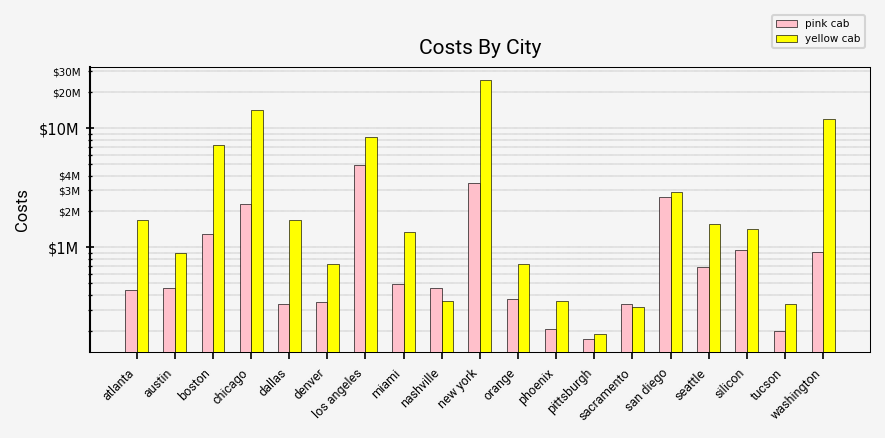

In [124]:
# Group data according to company by state
state_revenue = mdf.groupby(['company', 'city'], observed=True).agg({'cost':'sum'})

# Extract unique companies for legend
companies = state_revenue.index.get_level_values('company').unique()

# Create a figure and axis
fig1, ax1 = plt.subplots(figsize=(6, 3), dpi=150)

# Plot bars
plot_bars(state_revenue, fig1, ax1, companies, 'cost', 'city', 0.3)

# Format plot
format_plot(fig1, ax1, 'Costs', 'Costs By City', 'whitesmoke')

# Save figure
fig1.savefig('city_costs.png', dpi=300, bbox_inches='tight')


## Revenues By City

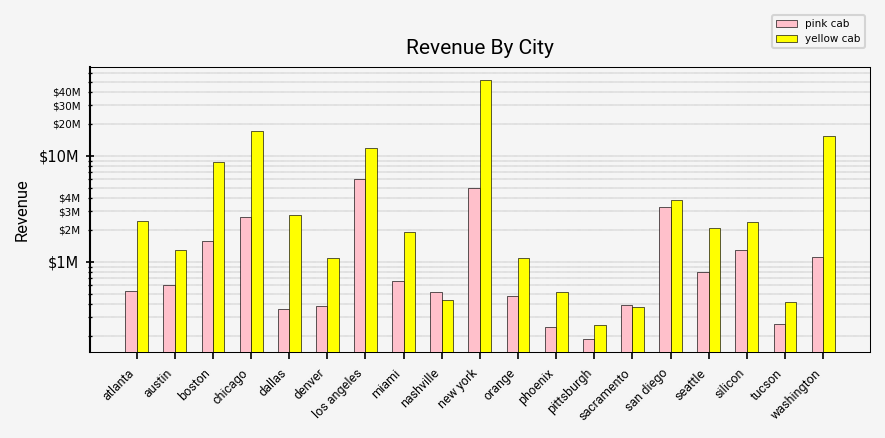

In [125]:

# Group data according to company by city
city_revenue = mdf.groupby(['city', 'company'], observed=True).agg({'price':'sum'})

# Extract unique companies for legend
companies = city_revenue.index.get_level_values('company').unique()

# Create a figure and axis
fig2, ax2 = plt.subplots(figsize=(6, 3), dpi=150)

# Plot bars
plot_bars(city_revenue, fig2, ax2, companies, 'price', 'city', 0.3)

# Format plot
format_plot(fig2, ax2, 'Revenue', 'Revenue By City', 'whitesmoke')

# Change 'ax' linewidth
ax2.spines['top'].set_linewidth(0.1)


In [126]:

colorz = ['#6b4469', '#cdbef6', '#de5a64', '#96defb', '#5daf34', '#437a70', '#1adeef', '#c6731d',
          '#ff8797', '#044d10', '#aa3885', '#a1dddb', '#3b6021', '#b3274f', '#14373c', '#68ddf0',
          '#25c364', '#48bb7a', '#8fd45b', '#c2deb9', '#ca5f53', '#71b811', '#ebc0d9', '#4e7bdc',
          '#7afa0a', '#87698c', '#f7ce7b', '#b2d8e7', '#f18639', '#20b3a4', '#f4a8f8', '#9d532e',
          '#9e7f8e', '#1c898e', '#f9f76d', '#ce1e46', '#a4db3a', '#c67e7c', '#55decd', '#a6ac6a',
          '#285537', '#e6bbaa', '#478ab5', '#5c238b', '#4975cc', '#8f860e', '#d30a5d', '#779ab5']


# Create a crosstab function to explore categorical data

def visualize(data, feature, target, colors):
    # Create the figure and axes
    fig, ax = plt.subplots(figsize=(30,15), dpi=150)
    
    # Plot the graph
    crosstab_result = pd.crosstab(data[feature], data[target], normalize=0)
    crosstab_result = crosstab_result.fillna(0)
    
    graph = crosstab_result.plot(
        kind='bar', ax=ax, color=colors, width=.5, align='center', edgecolor='black', linewidth=.8, zorder=4)
    
    # Add vertical lines between groups of brands
    for i in range(len(crosstab_result)):
        if i > 0:
            ax.axvline(x=i - 0.5, color='gray', linewidth=4, linestyle='--')
    
    # Adjust the spacing around the chart
    plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1)
    
    # Adjust the size of the left y-axis tick labels
    ax.tick_params(axis='y', labelsize=25)
    ax.tick_params(axis='x', labelsize=25)
    
    # Adjust the left margin of the plot
    plt.margins(0.1)
    
    # Adjust the lineweights of the ax spines
    spines = ['left', 'top', 'right', 'bottom']
    for spine in spines:
        ax.spines[spine].set_linewidth(3)
    
    # Create a color dictionary
    color_dict = {label: colors[i % len(colors)] for i, label in enumerate(data[target].unique())}
 
    # This is debugging code: reverse the values of the color_dict
    if target == 'gender':
        key1_value = color_dict['male']
        key2_value = color_dict['female']
    
        color_dict['male'] = key2_value
        color_dict['female'] = key1_value

    # Configure and style the legend
    legend_labels = data[target].unique()
    legend_handles = [Patch(facecolor=color_dict[label], label=label) for label in legend_labels]
    
    plt.legend(
        handles=legend_handles,
        bbox_to_anchor=(0.5, 1.20),
        loc='upper center',
        ncol=13,
        borderaxespad=0.,
        borderpad=.5,
        prop={'size': 18}
    )
    
    # Set the x-axis label, and y-axis label
    ax.set_facecolor('whitesmoke')
    plt.xticks(rotation=-360, fontsize=20)
    plt.yticks(fontsize=30)
    plt.xlabel('COMPANY', fontsize=30, labelpad=30)
    plt.ylabel('% of FARES', fontsize=30, labelpad=20)
    plt.title(f'FARE FREQUENCY BY {target.upper()}', fontsize=40, pad=30)
    
    plt.tight_layout()  # Automatically adjust the layout
    plt.grid(True)
    plt.show()

    return crosstab_result, fig, ax



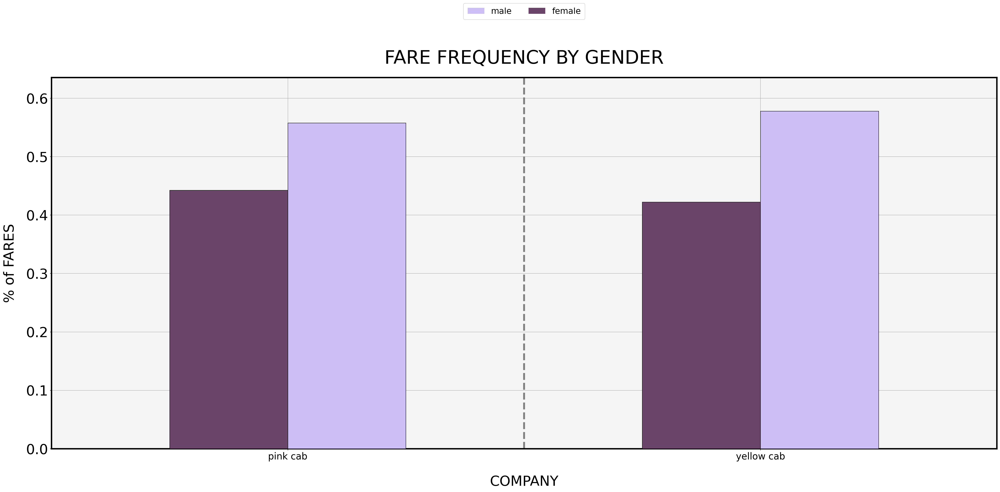

In [127]:
result, fig5, ax5 = visualize(mdf, 'company', 'gender', colorz)
fig5.savefig('gender_frequency.png')

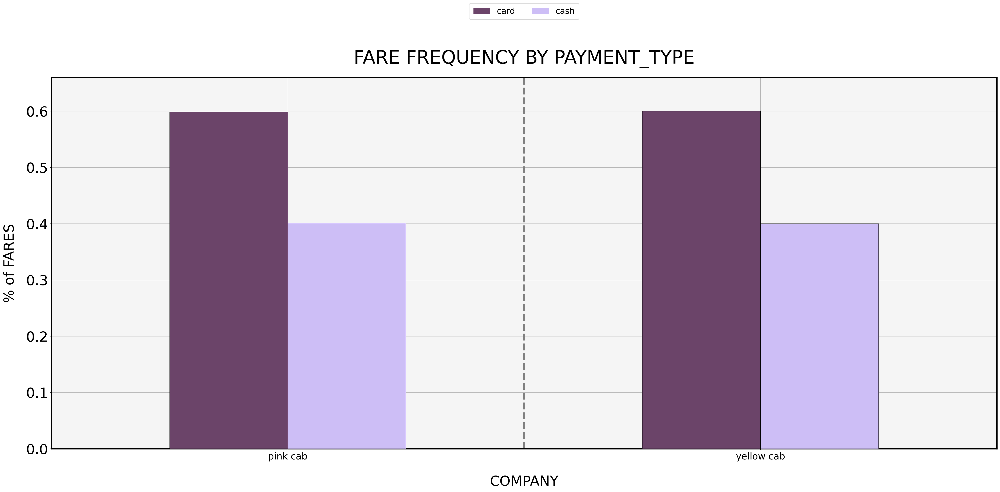

(payment_type  card  cash
 company                 
 pink cab      0.60  0.40
 yellow cab    0.60  0.40,
 <Figure size 4500x2250 with 1 Axes>,
 <Axes: title={'center': 'FARE FREQUENCY BY PAYMENT_TYPE'}, xlabel='COMPANY', ylabel='% of FARES'>)

In [128]:
visualize(mdf, 'company', 'payment_type', colorz)

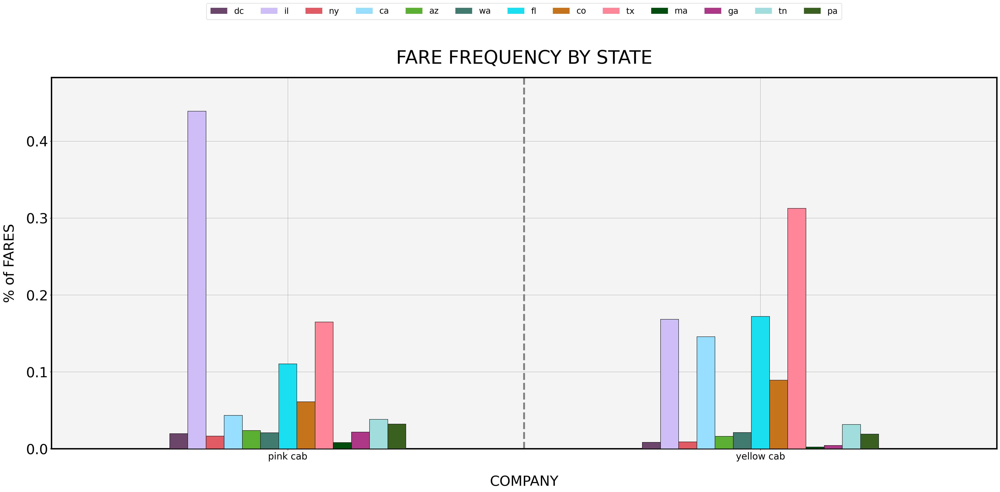

(state        az   ca   co   dc   fl   ga   il   ma   ny   pa   tn   tx   wa
 company                                                                    
 pink cab   0.02 0.44 0.02 0.04 0.02 0.02 0.11 0.06 0.16 0.01 0.02 0.04 0.03
 yellow cab 0.01 0.17 0.01 0.15 0.02 0.02 0.17 0.09 0.31 0.00 0.00 0.03 0.02,
 <Figure size 4500x2250 with 1 Axes>,
 <Axes: title={'center': 'FARE FREQUENCY BY STATE'}, xlabel='COMPANY', ylabel='% of FARES'>)

In [129]:
visualize(mdf, 'company', 'state', colorz)

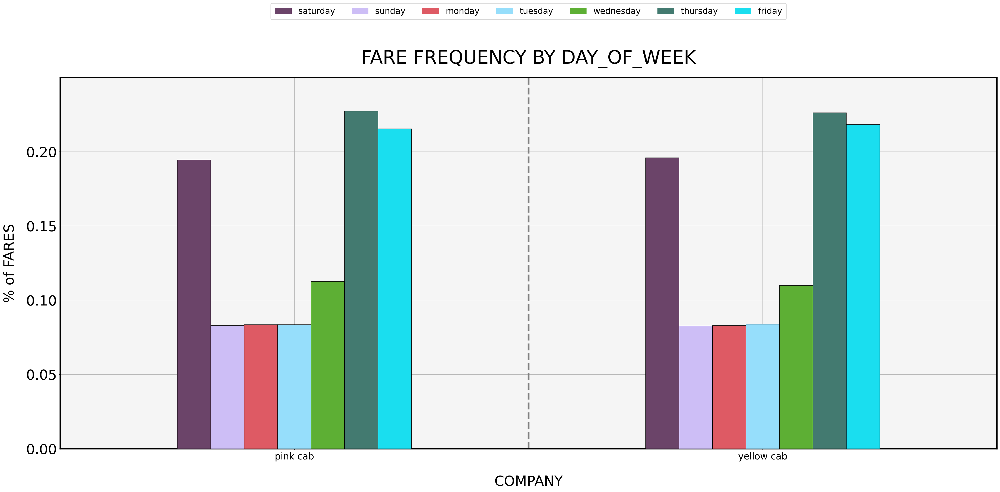

(day_of_week  sunday  monday  tuesday  wednesday  thursday  friday  saturday
 company                                                                    
 pink cab       0.19    0.08     0.08       0.08      0.11    0.23      0.22
 yellow cab     0.20    0.08     0.08       0.08      0.11    0.23      0.22,
 <Figure size 4500x2250 with 1 Axes>,
 <Axes: title={'center': 'FARE FREQUENCY BY DAY_OF_WEEK'}, xlabel='COMPANY', ylabel='% of FARES'>)

In [130]:
crosstab_result = visualize(mdf, 'company', 'day_of_week', colorz)
crosstab_result

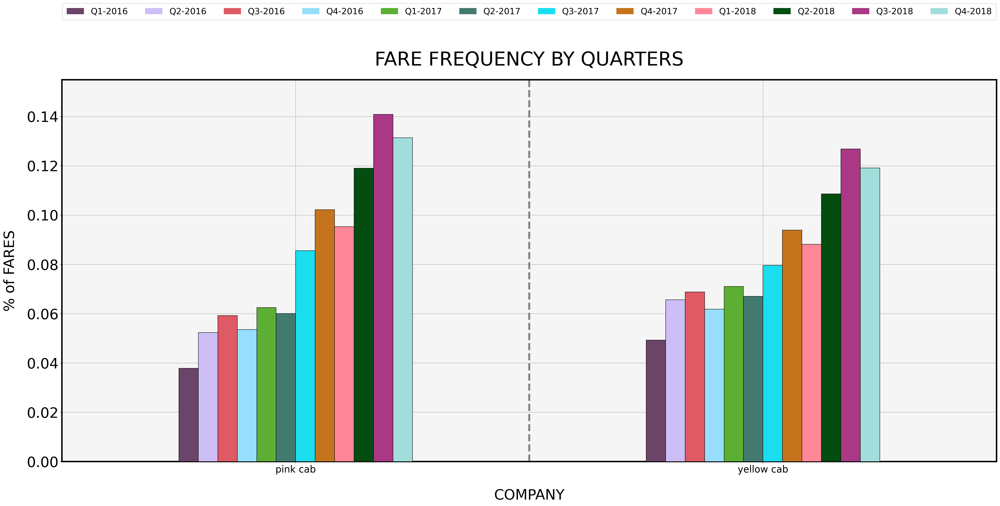

(quarters    Q1-2016  Q1-2017  Q1-2018  Q2-2016  Q2-2017  Q2-2018  Q3-2016  \
 company                                                                     
 pink cab       0.04     0.05     0.06     0.05     0.06     0.06     0.09   
 yellow cab     0.05     0.07     0.07     0.06     0.07     0.07     0.08   
 
 quarters    Q3-2017  Q3-2018  Q4-2016  Q4-2017  Q4-2018  
 company                                                  
 pink cab       0.10     0.10     0.12     0.14     0.13  
 yellow cab     0.09     0.09     0.11     0.13     0.12  ,
 <Figure size 4500x2250 with 1 Axes>,
 <Axes: title={'center': 'FARE FREQUENCY BY QUARTERS'}, xlabel='COMPANY', ylabel='% of FARES'>)

In [131]:
crosstab_result = visualize(mdf, 'company', 'quarters', colorz)
crosstab_result

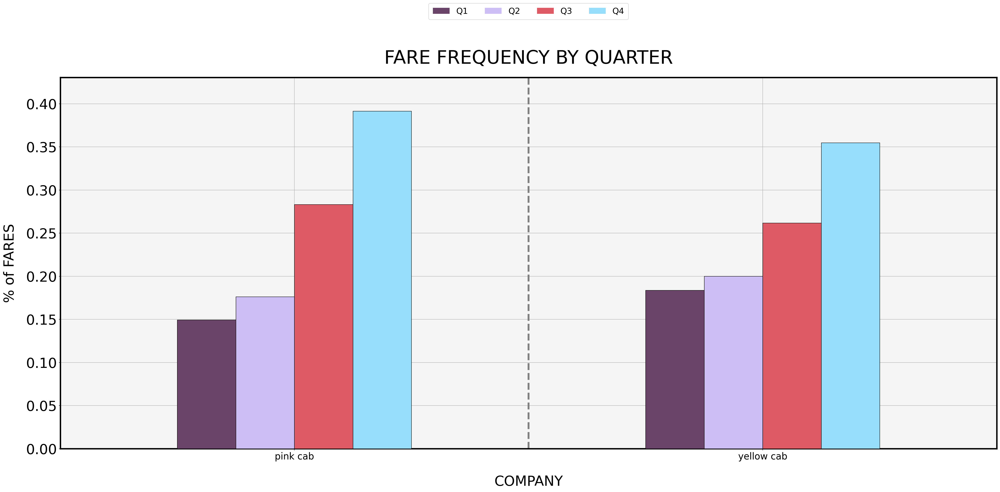

(quarter      Q1   Q2   Q3   Q4
 company                       
 pink cab   0.15 0.18 0.28 0.39
 yellow cab 0.18 0.20 0.26 0.35,
 <Figure size 4500x2250 with 1 Axes>,
 <Axes: title={'center': 'FARE FREQUENCY BY QUARTER'}, xlabel='COMPANY', ylabel='% of FARES'>)

In [132]:
crosstab_result = visualize(mdf, 'company', 'quarter', colorz)
crosstab_result

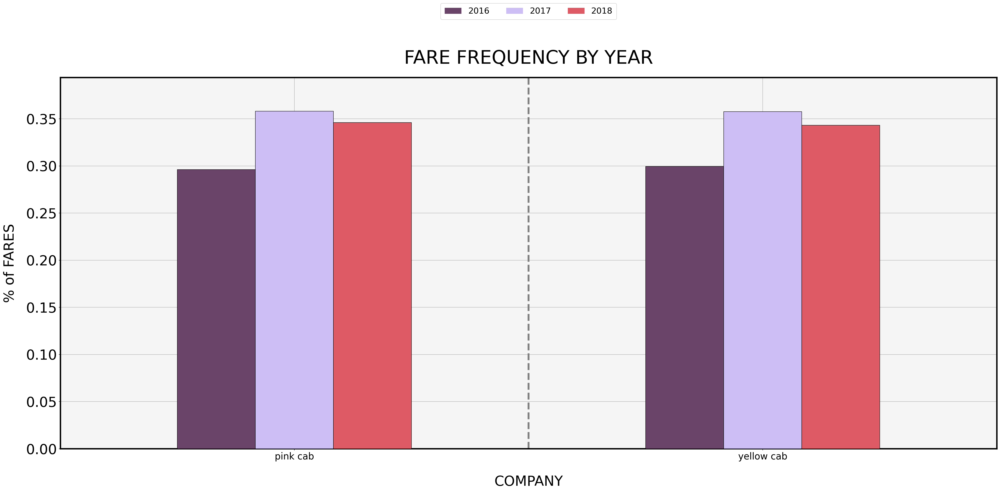

(year        2016  2017  2018
 company                     
 pink cab    0.30  0.36  0.35
 yellow cab  0.30  0.36  0.34,
 <Figure size 4500x2250 with 1 Axes>,
 <Axes: title={'center': 'FARE FREQUENCY BY YEAR'}, xlabel='COMPANY', ylabel='% of FARES'>)

In [133]:
crosstab_result = visualize(mdf, 'company', 'year', colorz)
crosstab_result

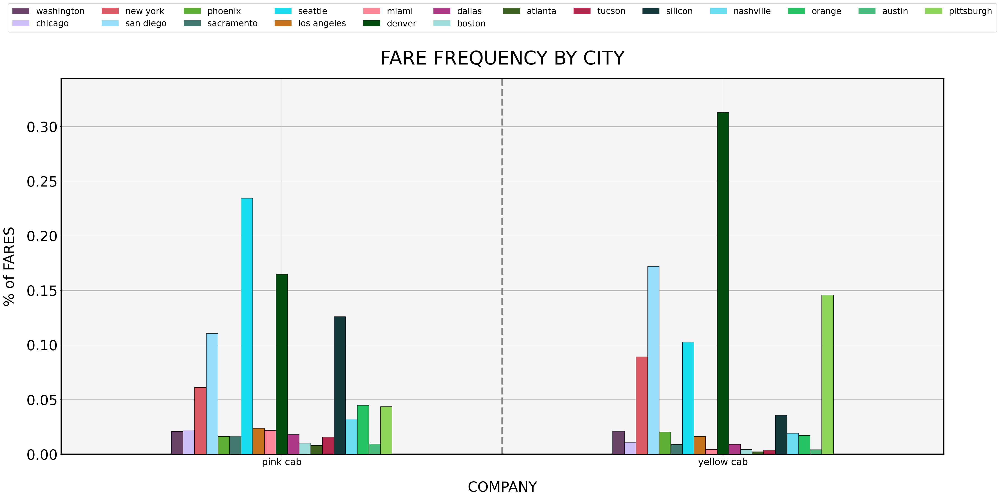

(city        atlanta  austin  boston  chicago  dallas  denver  los angeles  \
 company                                                                     
 pink cab       0.02    0.02    0.06     0.11    0.02    0.02         0.23   
 yellow cab     0.02    0.01    0.09     0.17    0.02    0.01         0.10   
 
 city        miami  nashville  new york  orange  phoenix  pittsburgh  \
 company                                                               
 pink cab     0.02       0.02      0.16    0.02     0.01        0.01   
 yellow cab   0.02       0.00      0.31    0.01     0.00        0.00   
 
 city        sacramento  san diego  seattle  silicon  tucson  washington  
 company                                                                  
 pink cab          0.02       0.13     0.03     0.04    0.01        0.04  
 yellow cab        0.00       0.04     0.02     0.02    0.00        0.15  ,
 <Figure size 4500x2250 with 1 Axes>,
 <Axes: title={'center': 'FARE FREQUENCY BY CITY'}, xlabe

In [134]:
crosstab_result = visualize(mdf, 'company', 'city', colorz)
crosstab_result

In [135]:
# Transpose the 'ctab_results'
ctab = crosstab_result[0].T.reset_index()
print(ctab)
# Merge the two DataFrames on the 'city' column
cdf = pd.merge(cdf, ctab, on='city')

# Create index 20 
cdf.loc[20] = ['san francisco', 629591, 213609, 0.34, 'ca', 0.00, 0.00]

# Sort by city
cdf.sort_values(by='city', inplace=True)

# Display
cdf

company         city  pink cab  yellow cab
0            atlanta      0.02        0.02
1             austin      0.02        0.01
2             boston      0.06        0.09
3            chicago      0.11        0.17
4             dallas      0.02        0.02
5             denver      0.02        0.01
6        los angeles      0.23        0.10
7              miami      0.02        0.02
8          nashville      0.02        0.00
9           new york      0.16        0.31
10            orange      0.02        0.01
11           phoenix      0.01        0.00
12        pittsburgh      0.01        0.00
13        sacramento      0.02        0.00
14         san diego      0.13        0.04
15           seattle      0.03        0.02
16           silicon      0.04        0.02
17            tucson      0.01        0.00
18        washington      0.04        0.15


,city,pop,users,% of users,state,pink cab,yellow cab
0,atlanta,814885,24701,0.03,ga,0.02,0.02
1,austin,698371,14978,0.02,tx,0.02,0.01
2,boston,248968,80021,0.32,ma,0.06,0.09
3,chicago,1955130,164468,0.08,il,0.11,0.17
4,dallas,942908,22157,0.02,tx,0.02,0.02
5,denver,754233,12421,0.02,co,0.02,0.01
6,los angeles,1595037,144132,0.09,ca,0.23,0.10
7,miami,1339155,17675,0.01,fl,0.02,0.02
8,nashville,327225,9270,0.03,tn,0.02,0.00
9,new york,8405837,302149,0.04,ny,0.16,0.31


In [136]:

# Create a mapper
newcdf_names = {'% of users':'% of users in pop','pink cab':'pink mkt share', 'yellow cab':'yellow mkt share'}

# Rename columns
cdf.rename(newcdf_names, axis=1, inplace=True)

# Create a total column
cdf['total mkt share'] = cdf['pink mkt share'] + cdf['yellow mkt share']

# Display
cdf


,city,pop,users,% of users in pop,state,pink mkt share,yellow mkt share,total mkt share
0,atlanta,814885,24701,0.03,ga,0.02,0.02,0.04
1,austin,698371,14978,0.02,tx,0.02,0.01,0.03
2,boston,248968,80021,0.32,ma,0.06,0.09,0.15
3,chicago,1955130,164468,0.08,il,0.11,0.17,0.28
4,dallas,942908,22157,0.02,tx,0.02,0.02,0.04
5,denver,754233,12421,0.02,co,0.02,0.01,0.03
6,los angeles,1595037,144132,0.09,ca,0.23,0.10,0.34
7,miami,1339155,17675,0.01,fl,0.02,0.02,0.04
8,nashville,327225,9270,0.03,tn,0.02,0.00,0.03
9,new york,8405837,302149,0.04,ny,0.16,0.31,0.48


## MrktShare & Profit Growth Rates: Yellow & Pink Cab Companies

In [137]:

def format_plot(data, fig, ax, xlab, ylab, title, axis='y'):
    
    # Define the custom y-axis tick locations and labels in data units
    custom_ticks = [1e6, 2e6, 10e6]
    custom_labels = ['$1M', '$2M', '$10M']

    # Within the format_plot function
    ax.yaxis.set_major_formatter(FuncFormatter(format_y_ticks))

    # Set font size
    plt.yticks(fontsize=5)

    # Set labels and title
    ax.set_xlabel(xlab, fontproperties=roboto, fontsize=7)
    ax.set_ylabel(ylab, fontproperties=roboto, fontsize=7)
    ax.set_title(f'{title}', fontproperties=roboto, fontsize=9)
    
    # Set tick parameters
    ax.tick_params(axis='x', labelrotation=45, labelsize=7)

    # Set spine parameters
    ax.spines['left'].set_linewidth(.5)
    ax.spines['bottom'].set_linewidth(.5)
    ax.spines['top'].set_linewidth(.3)
    ax.spines['right'].set_linewidth(.3)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1, 1), prop={'size': 7})

    # Set ax facecolor
    #ax = plt.gca()
    fig.set_facecolor('whitesmoke')

    # Set the color of the plot perimeter (spines)
    perimeter_color = 'black'  
    ax.spines['top'].set_color(perimeter_color)
    ax.spines['right'].set_color(perimeter_color)
    ax.spines['bottom'].set_color(perimeter_color)
    ax.spines['left'].set_color(perimeter_color)

    # Display the plot
    plt.tight_layout()
    plt.grid(True, linewidth=.5, color='black', axis=axis)
    plt.tight_layout()
  

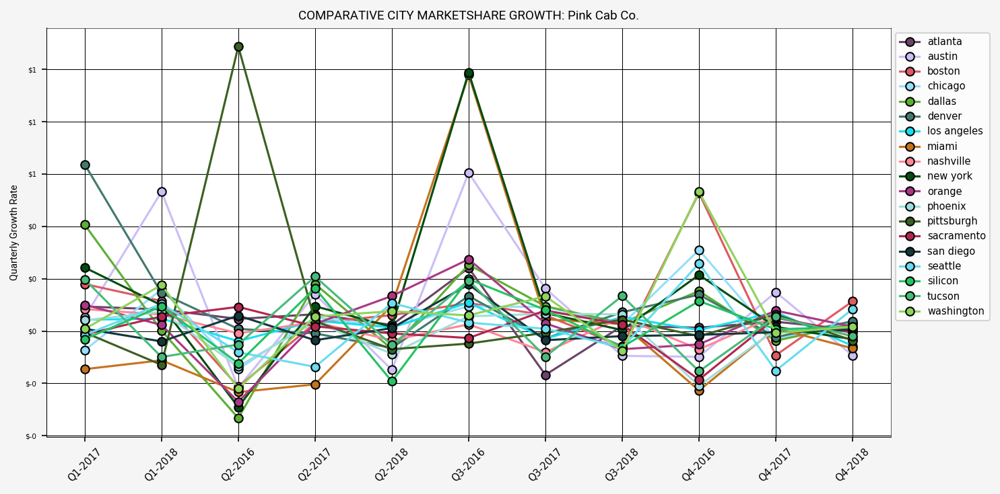

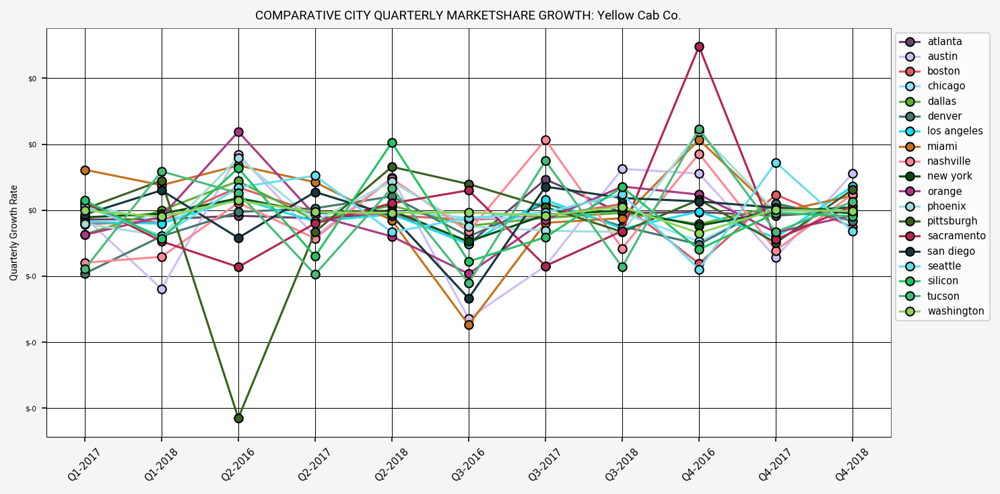

In [138]:

# Group the data
qrtrly_mrkt_share = mdf.groupby(['city', 'quarters', 'company'], observed=True)['price'].sum() / mdf.groupby(['city', 'quarters'], observed=True)['price'].sum()

# Create df to store the quarterly market share data for each city
cdf = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
cdf['pink growth_rate'] = cdf.groupby('city', observed=True)['pink cab'].pct_change()
cdf['yellow growth_rate'] = cdf.groupby('city', observed=True)['yellow cab'].pct_change()


# ## Visualize the quarter growth rates

fig13, ax13 = plt.subplots(figsize=(10, 5), dpi=150)

# Plot growth rates for pink cab
for i, (city, data) in enumerate(cdf.groupby('city', observed=True)):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')

format_plot(cdf, fig13, ax13, '', 'Quarterly Growth Rate', 'COMPARATIVE CITY MARKETSHARE GROWTH: Pink Cab Co.', 
            axis='both')


# # Plot growth rates for yellow cab

fig14, ax14 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(cdf.groupby('city', observed=True)):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')

format_plot(cdf, fig14, ax14, '', 'Quarterly Growth Rate', 'COMPARATIVE CITY QUARTERLY MARKETSHARE GROWTH: Yellow Cab Co.',
            axis='both')


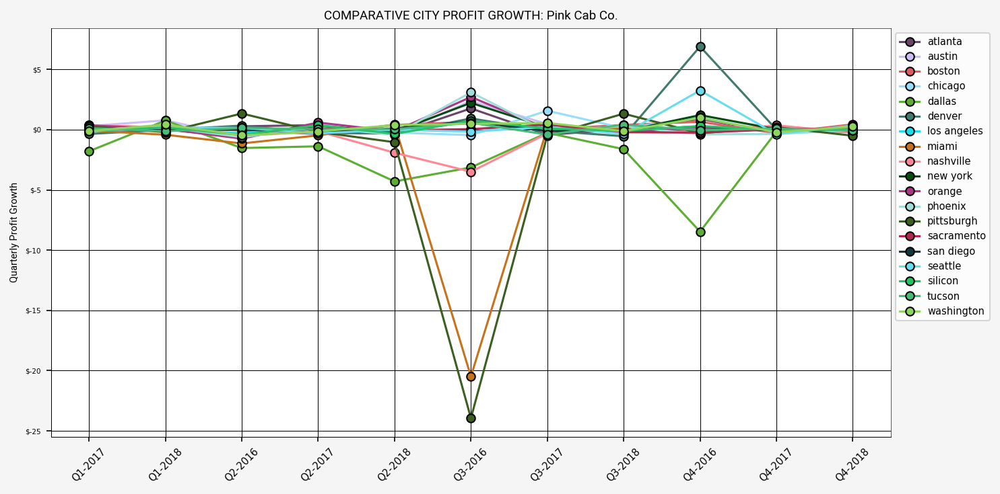

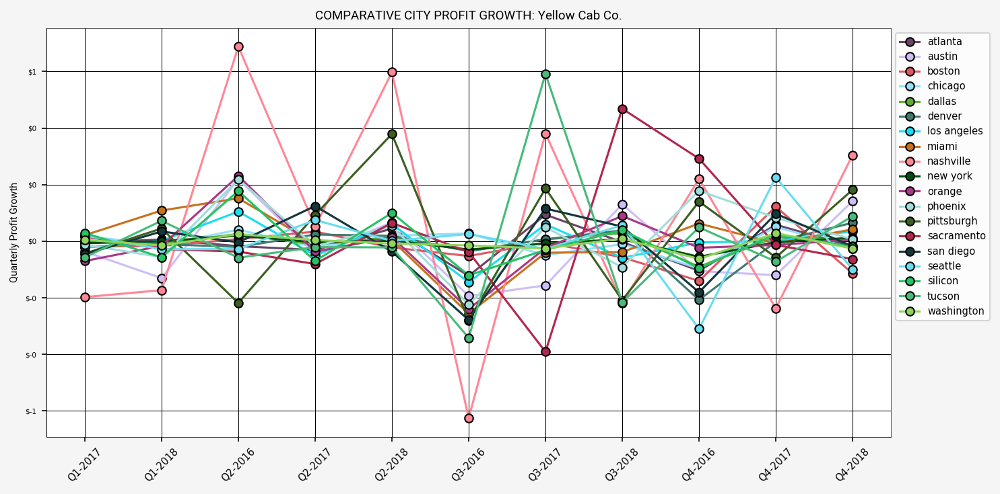

In [139]:

# Group the data
qrtrly_mrkt_share = mdf.groupby(['city', 'quarters', 'company'], observed=True)['profit'].sum() / mdf.groupby(['city', 'quarters'], observed=True)['profit'].sum()

# Create df to store the quarterly market share data for each city
mrkt_share_df = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
mrkt_share_df['pink growth_rate'] = mrkt_share_df.groupby('city', observed=True)['pink cab'].pct_change()
mrkt_share_df['yellow growth_rate'] = mrkt_share_df.groupby('city', observed=True)['yellow cab'].pct_change()

# Drop 'nan', and extreme outlier
mrkt_share_df.drop(0, axis=0, inplace=True)
mrkt_share_df.drop(62, axis=0, inplace=True)

## Visualize the quarter growth rates
fig15, ax15 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('city', observed=True)):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig15, ax15, '', 'Quarterly Profit Growth', 'COMPARATIVE CITY PROFIT GROWTH: Pink Cab Co.',
            axis='both')

# Plot growth rates for yellow cab
fig16, ax16 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('city', observed=True)):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig16, ax16, '', 'Quarterly Profit Growth', 'COMPARATIVE CITY PROFIT GROWTH: Yellow Cab Co.', 
            axis='both')


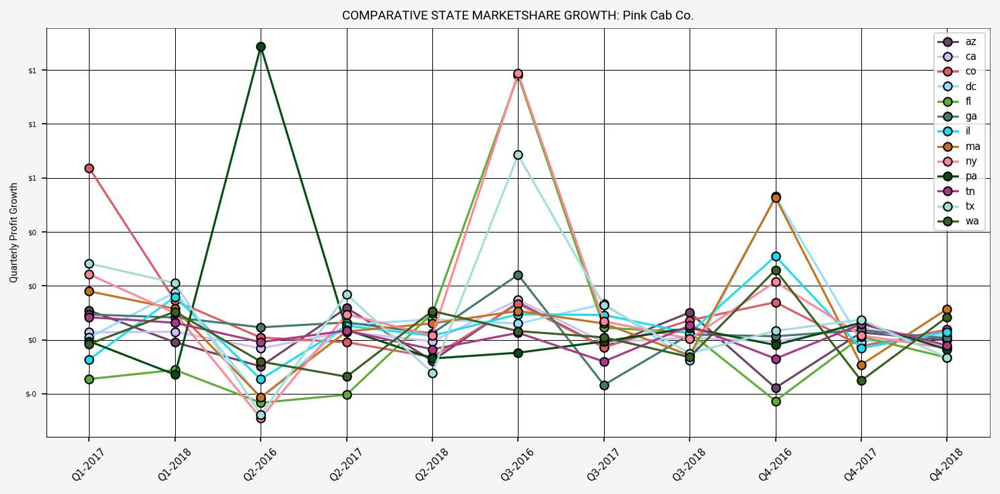

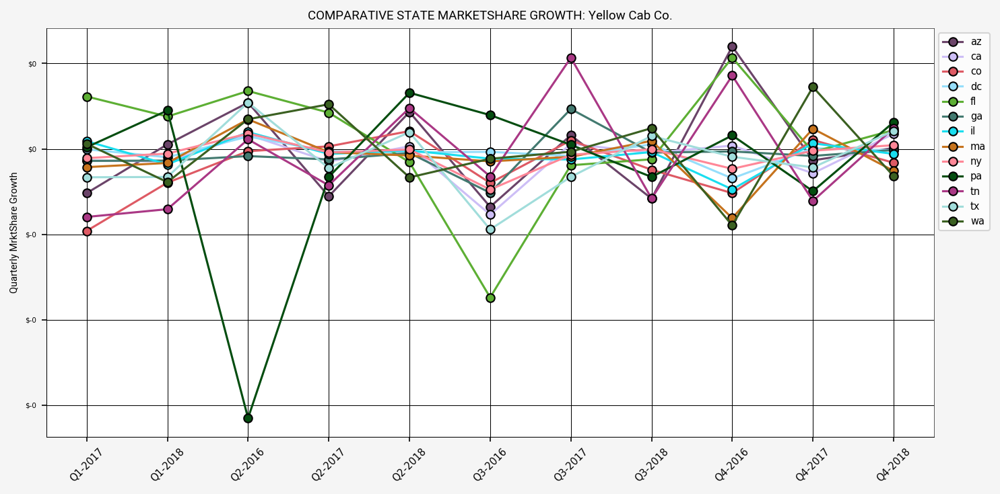

In [140]:
# Group the data
qrtrly_mrkt_share = mdf.groupby(['state', 'quarters', 'company'], observed=True)['price'].sum() / mdf.groupby(['state', 'quarters'], observed=True)['price'].sum()

# Create df to store the quarterly market share data for each city
mrkt_share_df = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
mrkt_share_df['pink growth_rate'] = mrkt_share_df.groupby('state', observed=True)['pink cab'].pct_change()
mrkt_share_df['yellow growth_rate'] = mrkt_share_df.groupby('state', observed=True)['yellow cab'].pct_change()


## Visualize the quarter growth rates

fig16, ax16 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state', observed=True)):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig16, ax16, '', 'Quarterly Profit Growth', 'COMPARATIVE STATE MARKETSHARE GROWTH: Pink Cab Co.',
            axis='both')


fig17, ax17 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state', observed=True)):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig17, ax17, '', 'Quarterly MrktShare Growth', 'COMPARATIVE STATE MARKETSHARE GROWTH: Yellow Cab Co.',
            axis='both')

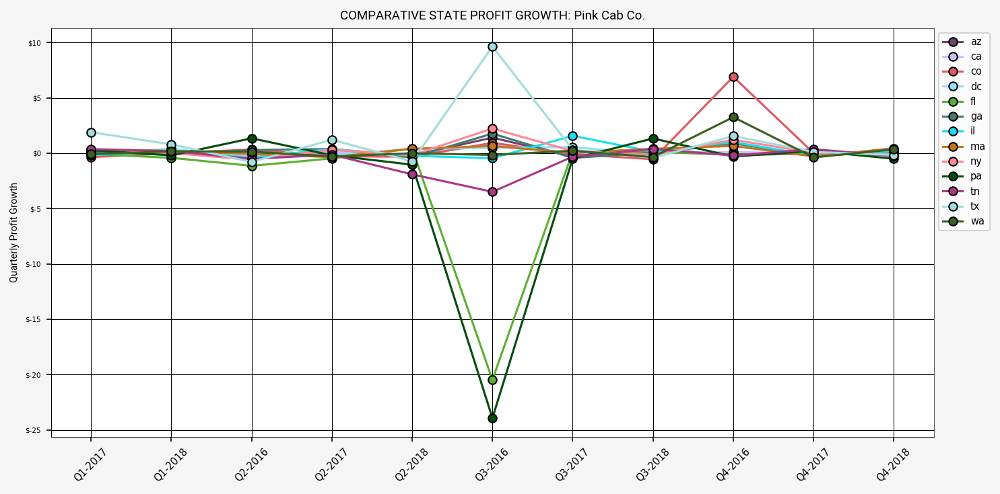

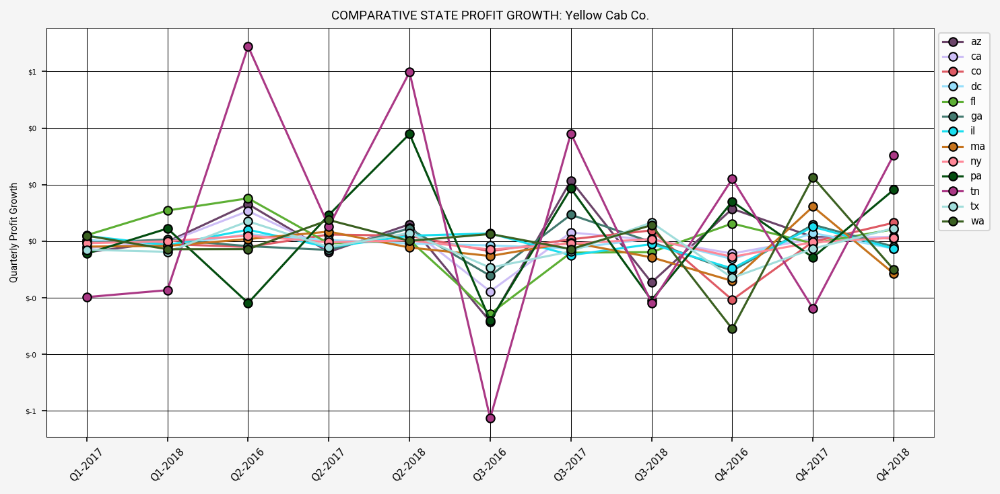

In [141]:
# Group the data
qrtrly_mrkt_share = mdf.groupby(['state', 'quarters', 'company'], observed=True)['profit'].sum() / mdf.groupby(['state', 'quarters'], observed=True)['profit'].sum()

# Create df to store the quarterly market share data for each city
mrkt_share_df = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
mrkt_share_df['pink growth_rate'] = mrkt_share_df.groupby('state', observed=True)['pink cab'].pct_change()
mrkt_share_df['yellow growth_rate'] = mrkt_share_df.groupby('state', observed=True)['yellow cab'].pct_change()

# Drop 'nan', and extreme outlier
mrkt_share_df.drop(0, axis=0, inplace=True)
mrkt_share_df.drop(26, axis=0, inplace=True)

## Visualize the quarter growth rates
fig18, ax18 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state', observed=True)):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig18, ax18, '', 'Quarterly Profit Growth', 'COMPARATIVE STATE PROFIT GROWTH: Pink Cab Co.',
            axis='both')


fig19, ax19 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state', observed=True)):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig19, ax19, '', 'Quarterly Profit Growth', 'COMPARATIVE STATE PROFIT GROWTH: Yellow Cab Co.',
            axis='both')


In [142]:
# Results: Each company has it strengths and weakneses. However, I would recommend not to buy pink cab, 
# and be cautious with buying Yellow cab. While histoically Yellow Cab
# Is performing much better than pink, an identical trend was discovered within both of Pink Cabs and Yellow Cabs 
# profit history, and then forecasted. In short, each successive yearly cycle is generating less profits. This can be seen with the three years
# data that we have looked at thus far. To see if this trend is part of a larger trend. More data needs to be
# analyzed. If the current profit trend continues it's course, both companies will be in the red by 2020. 
# XYZ should keep in mind that traditional cab companies profits, have been getting eaten up by rideshare companies like 
# Uber and Lyft over the past 5-10 years, and is what is most likely, in my opinion, the cause of the major decrease in profits.
# The trend that we see could be due to more users adopting to take Uber and Lyft instead of traditional cab companies. 
# Therefore, I recommend that XYZ, be cautious before buying Yellow cab, while simultaneously looking at potential 
# oppurtunities to run a fleet of rideshare vehicles.

## The supporting evidence will be showcased during the presentation. 

In [143]:
mdf.head()

,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week,age_category,profit_margin
date,,,,,,,,,,,,,,,,,,,
2016-01-02,10001340,52536,yellow cab,washington,dc,6.34,202.54,135.86,card,male,24,10606,Q1,2016,Q1-2016,66.68,saturday,18-24,0.33
2016-01-02,10000640,4844,yellow cab,chicago,il,9.69,374.66,209.66,cash,male,32,5548,Q1,2016,Q1-2016,165.00,saturday,25-34,0.44
2016-01-02,10000635,5671,yellow cab,chicago,il,15.58,532.83,337.08,cash,male,24,7081,Q1,2016,Q1-2016,195.75,saturday,18-24,0.37
2016-01-02,10001001,2761,yellow cab,new york,ny,29.07,1391.91,595.30,card,male,40,11462,Q1,2016,Q1-2016,796.61,saturday,35-54,0.57
2016-01-02,10000171,20687,pink cab,san diego,ca,8.87,269.15,147.08,cash,male,39,8926,Q1,2016,Q1-2016,122.07,saturday,35-54,0.45


In [144]:
# Function to create grouped bar charts
def plot_bars(df, fig, ax, companies, level1, level2, barwidth):

    # Bar colors
    colors = ['pink', 'yellow']

    # Set bar width
    width = barwidth  
    
    for i, company in enumerate(companies):
        # Get company cross-section of dataframe
        grp_revenue_company = df.xs(company, level='company')
        # Values for x-axis
        x = range(len(grp_revenue_company))
        # Create x-axis list such that each successive iteration shifts x-values to the right by the width of a single bar
        x_shifted = [val + i * width for val in x]
        # Plot the bars
        ax.bar(x_shifted, grp_revenue_company[level1], width=width, label=company, log=True,  
               zorder=4, color=colors[i], edgecolor='black', linewidth=.3, alpha=1)

    # Set x-axis labels and ticks
    ax.set_xticks([val + width * (len(companies) - 1) / 2 for val in x])
    ax.set_xticklabels(grp_revenue_company.index.get_level_values(level2), rotation=45, ha='right', fontproperties=roboto,
                       fontsize=6)

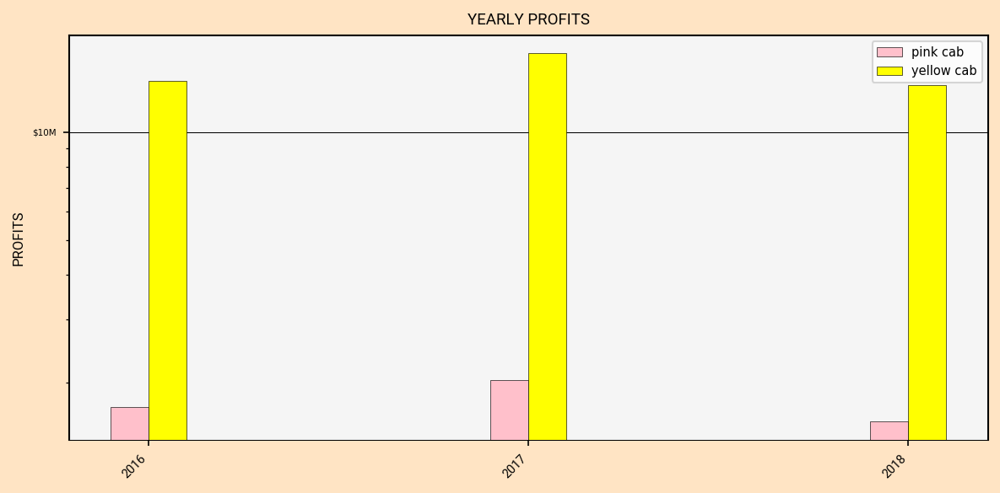

In [145]:
ycab = mdf[mdf['company'] == 'yellow cab']
pcab = mdf[mdf['company'] == 'pink cab']

pcabqprofits = mdf.groupby(['year', 'company'], observed=True).agg({'profit': 'sum'})



# Extract unique companies for legend
companies = pcabqprofits.index.get_level_values('company').unique()


# Create the plot
fig20, ax20 = plt.subplots(figsize=(8, 4), dpi=150)
plot_bars(pcabqprofits, fig20, ax20, companies,'profit', 'year', 0.1)
format_plot(pcabqprofits, fig20, ax20, '', 'PROFITS', 'YEARLY PROFITS')

ax20.set_facecolor('whitesmoke')

fig20.set_facecolor('bisque')
ax20.spines['left'].set_linewidth(1)
ax20.spines['right'].set_linewidth(1)
ax20.spines['top'].set_linewidth(1)
plt.ylabel('PROFITS', fontsize=8, fontproperties=roboto)
plt.xticks(rotation=45)  
plt.show()



In [146]:
dfs()

['__', '___', 'df1', 'df2', 'df3', 'df4', 'mdf', '_14', '_15', 'cdf', '_21', '_22', '_25', '_26', '_27', '_29', '_30', '_31', '_34', '_35', '_37', '_38', 'pcab', 'ycab', 'pink_corr_matrix', 'yellow_corr_matrix', 'cont_feat_df', 'data', 'cont_features_df', 'cont_feat_copy_df', 'ydescriptive', '_57', 'pdescriptive', '_58', 'pink_cab', 'yellow_cab', 'grouped', 'pcab0', 'ycab0', 'pcabycab', 'rides_by_cust', 'pcabycabrides_by_cust', '_77', '_78', 'cab_prfts', 'cab_costs', 'cab_price', '_79', 'profit_df', 'X', 'state_revenue', 'city_revenue', 'result', 'ctab', '_135', '_136', 'mrkt_share_df', '_143', 'pcabqprofits']


## Statistical Significant Difference in Profits?

In [147]:
pcab = mdf[mdf['company'] == 'pink cab']
ycab = mdf[mdf['company'] == 'yellow cab']

In [148]:
# Create a model using ordinary least squares (OLS) (y=profit, x=day_of_week)
model = ols('profit ~ day_of_week', data=ycab).fit()

# Perform the ANOVA test for difference in profits for each day of the week (Pink Cab)
anova_table = sm.stats.anova_lm(model, typ=2)

# Perform Tukey's HSD test
tukey_results = sm.stats.multicomp.pairwise_tukeyhsd(pcab['profit'], pcab['day_of_week'])

print("ANOVA results:")
print(anova_table)

print("Tukey's HSD results:")
print(tukey_results)

ANOVA results:
                   sum_sq        df      F  PR(>F)
day_of_week   79358048.41      6.00 452.41    0.00
Residual    8030137612.80 274674.00    NaN     NaN
Tukey's HSD results:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1    group2  meandiff p-adj   lower    upper   reject
-----------------------------------------------------------
  friday    monday -21.9678    0.0 -25.1173 -18.8183   True
  friday  saturday  -1.5723 0.4241  -3.9075   0.7629  False
  friday    sunday   8.4774    0.0   6.0785  10.8764   True
  friday  thursday  -22.192    0.0 -25.0212 -19.3628   True
  friday   tuesday -21.3691    0.0 -24.5112 -18.2269   True
  friday wednesday -21.6395    0.0 -24.7818 -18.4972   True
  monday  saturday  20.3955    0.0  17.2231  23.5679   True
  monday    sunday  30.4452    0.0  27.2256  33.6649   True
  monday  thursday  -0.2242    1.0   -3.776   3.3276  False
  monday   tuesday   0.5987 0.9993  -3.2071   4.4045  False
  monday wednesday   0.3283    

In [149]:
# Create a model using ordinary least squares (OLS)
model = ols('profit ~ day_of_week', data=ycab).fit()

# Perform the ANOVA test
anova_table = sm.stats.anova_lm(model, typ=2)

# Perform Tukey's HSD test
tukey_results = sm.stats.multicomp.pairwise_tukeyhsd(ycab['profit'], ycab['day_of_week'])

print("ANOVA results:")
print(anova_table)

print("Tukey's HSD results:")
print(tukey_results)

ANOVA results:
                   sum_sq        df      F  PR(>F)
day_of_week   79358048.41      6.00 452.41    0.00
Residual    8030137612.80 274674.00    NaN     NaN
Tukey's HSD results:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1    group2  meandiff p-adj   lower    upper   reject
-----------------------------------------------------------
  friday    monday  -30.018    0.0 -33.9272 -26.1089   True
  friday  saturday  -2.3128 0.2144  -5.1982   0.5726  False
  friday    sunday  11.5247    0.0   8.5566  14.4927   True
  friday  thursday -32.6093    0.0 -36.1455 -29.0732   True
  friday   tuesday -30.1686    0.0 -34.0729 -26.2644   True
  friday wednesday  -31.785    0.0 -35.6741 -27.8958   True
  monday  saturday  27.7052    0.0  23.7772  31.6333   True
  monday    sunday  41.5427    0.0  37.5536  45.5318   True
  monday  thursday  -2.5913 0.5989  -7.0194   1.8368  False
  monday   tuesday  -0.1506    1.0  -4.8779   4.5767  False
  monday wednesday  -1.7669 0.9

In [150]:
# Create a model using ordinary least squares (OLS)
model = ols('profit ~ gender', data=pcab).fit()

# Perform the ANOVA test
anova_table = sm.stats.anova_lm(model, typ=2)

# Perform Tukey's HSD test
tukey_results = sm.stats.multicomp.pairwise_tukeyhsd(pcab['profit'], pcab['gender'])

print("ANOVA results:")
print(anova_table)

print("Tukey's HSD results:")
print(tukey_results)

ANOVA results:
               sum_sq       df    F  PR(>F)
gender       14942.57     1.00 2.48    0.12
Residual 509961858.45 84709.00  NaN     NaN
Tukey's HSD results:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
female   male   0.8456 0.1152 -0.2064 1.8976  False
---------------------------------------------------


In [151]:
# Create a model using ordinary least squares (OLS)
model = ols('profit ~ gender', data=ycab).fit()

# Perform the ANOVA test
anova_table = sm.stats.anova_lm(model, typ=2)

# Perform Tukey's HSD test
tukey_results = sm.stats.multicomp.pairwise_tukeyhsd(ycab['profit'], ycab['gender'])

print("ANOVA results:")
print(anova_table)

print("Tukey's HSD results:")
print(tukey_results)


# - To increase the reliability of the results, lets check the variances of the two groups
#   and ensure 

ANOVA results:
                sum_sq        df      F  PR(>F)
gender      3140365.92      1.00 106.41    0.00
Residual 8106355295.29 274679.00    NaN     NaN
Tukey's HSD results:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj lower  upper  reject
-------------------------------------------------
female   male   6.8456   0.0 5.5449 8.1463   True
-------------------------------------------------


In [152]:
pcab['gender'].value_counts()

gender
male      47231
female    37480
Name: count, dtype: int64

In [153]:
ycab['gender'].value_counts()

gender
male      158681
female    116000
Name: count, dtype: int64

In [154]:
## > There is a statistically significant difference between the profitability of male and female riders
#    for Yellow Cab, but not Pink Cab

paverage_profits_by_gender = pcab.groupby('gender', observed=True)['profit'].mean()
print('Pink Cab: ', paverage_profits_by_gender, '\n')

yaverage_profits_by_gender = ycab.groupby('gender', observed=True)['profit'].mean()
print(yaverage_profits_by_gender['female'])

Pink Cab:  gender
female   62.18
male     63.03
Name: profit, dtype: float64 

156.30532459655174


In [155]:

# Separate males and females into their own dataframes from Yellow Cab
males = ycab[ycab['gender'] == 'male']
females = ycab[ycab['gender'] == 'female']

# Take a random sample of males of size = len(female) df
male_sample = males.sample(n=len(females), replace=False)

# Concatenate the two dataframes together
male_female_df = pd.concat([females, male_sample], ignore_index=True)


In [156]:
# Check for equal variances
print(np.std(males['profit']))
print(np.std(females['profit']))

174.44173563644915
168.09544952528876


In [157]:
from scipy.stats import levene

# H0: = variance
# Ha: != variance

stat, p = levene(females['profit'], males['profit'])

if p < 0.05:
    print (f'p-stat: {p}, reject the null variances are unequal')
else:
    print(f'p-val: {p}, fail to reject the null, variances are equal')

p-stat: 1.864019285237976e-24, reject the null variances are unequal


In [158]:
import pingouin as pg

# Combine profits
combined_profit_df = pd.concat([females['profit'], males['profit']], axis=0)
combined_profit_df

# Combine gender
combined_gender_df = pd.concat([females['gender'], males['gender']], axis=0)
combined_gender_df

# Combine gender & profits to run Welch's ANOVA
combined_df = pd.concat([combined_profit_df, combined_gender_df], axis=1)
combined_df


,profit,gender
date,,
2016-01-23,53.73,female
2016-01-23,49.50,female
2016-01-23,25.96,female
2016-01-23,263.61,female
2016-01-23,100.01,female
...,...,...
2018-12-31,88.39,male
2018-12-31,-101.62,male
2018-12-31,-14.29,male


In [159]:
# Perform Welch's ANOVA test which is robust to unequal variance
pg.welch_anova(dv='profit', between='gender', data=combined_df)

,Source,ddof1,ddof2,F,p-unc,np2
0,gender,1,255001.61,107.64,0.00,0.00


In [160]:
# Effect size
np.mean(combined_df[combined_df['gender'] == 'male']['profit']) - np.mean(combined_df[combined_df['gender'] == 'female']['profit'])

6.845623012802861

In [161]:
# This finding is more robust and reinforces our intial findings that male riders of Yellow Cab, on average
# result in higher profitability.

In [162]:
# Create a model using ordinary least squares (OLS)
model = ols('profit ~ age_category', data=pcab).fit()

# Perform the ANOVA test
anova_table = sm.stats.anova_lm(model, typ=2)

# Perform Tukey's HSD test
tukey_results = sm.stats.multicomp.pairwise_tukeyhsd(pcab['profit'], pcab['age_category'])

print("ANOVA results:")
print(anova_table)

print("Tukey's HSD results:")
print(tukey_results)

ANOVA results:
                   sum_sq       df    F  PR(>F)
age_category     26621.36     3.00 1.47    0.22
Residual     509950179.65 84707.00  NaN     NaN
Tukey's HSD results:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
 18-24  25-34   -0.824 0.6472 -2.6366 0.9887  False
 18-24  35-54  -1.4088 0.1882 -3.2191 0.4015  False
 18-24  55-64  -1.3471 0.5037 -3.8313 1.1371  False
 25-34  35-54  -0.5848 0.8195 -2.3083 1.1386  False
 25-34  55-64  -0.5231 0.9452 -2.9448 1.8986  False
 35-54  55-64   0.0617 0.9999 -2.3582 2.4816  False
---------------------------------------------------


In [163]:
# Create a model using ordinary least squares (OLS)
model = ols('profit ~ age_category', data=ycab).fit()

# Perform the ANOVA test
anova_table = sm.stats.anova_lm(model, typ=2)

# Perform Tukey's HSD test
tukey_results = sm.stats.multicomp.pairwise_tukeyhsd(ycab['profit'], ycab['age_category'])

print("ANOVA results:")
print(anova_table)

print("Tukey's HSD results:")
print(tukey_results)

ANOVA results:
                    sum_sq        df    F  PR(>F)
age_category     649981.11      3.00 7.34    0.00
Residual     8108845680.10 274677.00  NaN     NaN
Tukey's HSD results:
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
 18-24  25-34  -0.9084 0.7225 -3.1405  1.3236  False
 18-24  35-54   0.9905 0.6629 -1.2359  3.2168  False
 18-24  55-64  -4.3253 0.0017 -7.4003 -1.2504   True
 25-34  35-54   1.8989 0.0961 -0.2147  4.0125  False
 25-34  55-64  -3.4169 0.0177 -6.4113 -0.4225   True
 35-54  55-64  -5.3158    0.0  -8.306 -2.3257   True
----------------------------------------------------


In [179]:

# Calculate profit margins
pcab['profit_margin'] = pcab['profit']/pcab['price']
ycab['profit_margin'] = ycab['profit']/ycab['price']


/tmp/ipykernel_4411/3930381020.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_4411/3930381020.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [166]:
pcab_idx = np.arange(len(pcab))
ycab_idx = np.arange(len(ycab))

pcab.set_index(keys=pcab_idx, inplace=True)
ycab.set_index(keys=ycab_idx, inplace=True)

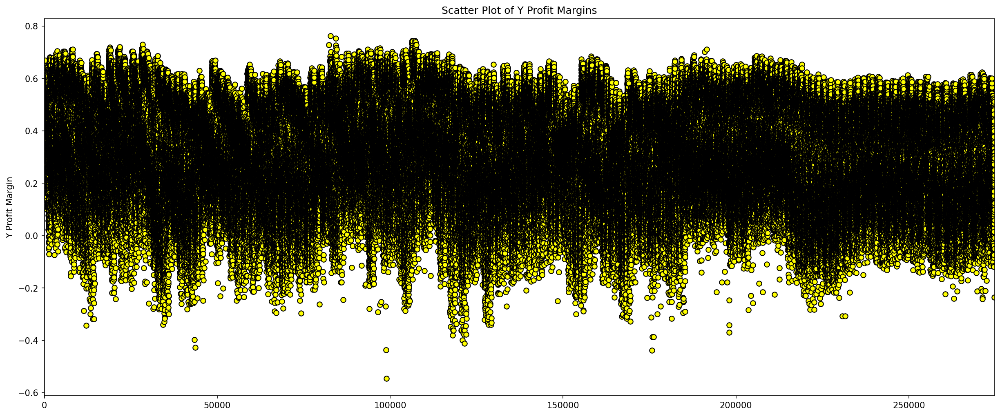

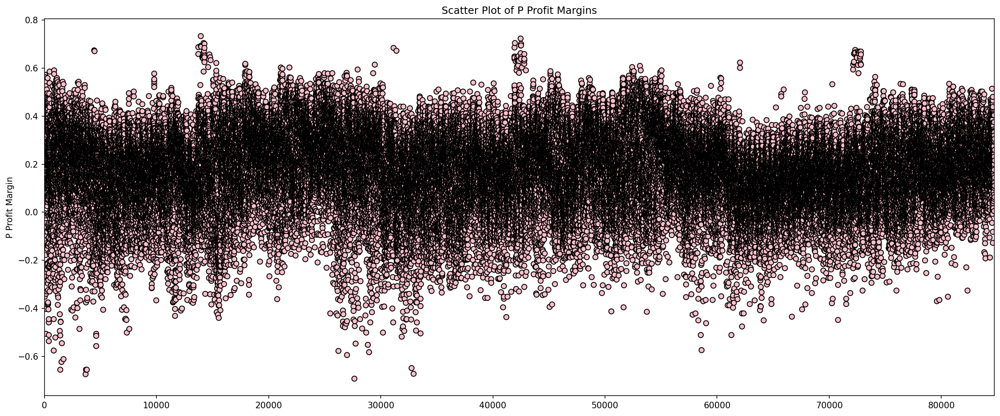

In [167]:

# Plot profit margins
fig23, ax23 = plt.subplots(figsize=(20, 8), dpi=150)
plt.scatter(ycab.index, ycab['profit_margin'], color='yellow', edgecolor='black')

# Adjust x-axis limits
ax23.set_xlim(ycab['profit_margin'].index.min(), ycab['profit_margin'].index.max())

# Set appropriate y-axis label and title
ax23.set_ylabel('Y Profit Margin')
ax23.set_title('Scatter Plot of Y Profit Margins')

plt.show()

fig22, ax22 = plt.subplots(figsize=(20, 8), dpi=150)
plt.scatter(pcab.index, pcab['profit_margin'], color='pink', edgecolor='black')

# Adjust x-axis limits
ax22.set_xlim(pcab['profit_margin'].index.min(), pcab['profit_margin'].index.max())

# Set appropriate y-axis label and title
ax22.set_ylabel('P Profit Margin')
ax22.set_title('Scatter Plot of P Profit Margins')

plt.show()


## What if Pink Cab Gave the Same Amount of Rides as Yellow Cab & Charged the Same Price?

## Would their Negative Profit Trend Be the Same? 

## Bootstrap Simulation

In [168]:
# Calculate the number of additional samples needed
num_samples = len(ycab) - len(pcab)

# Generate new samples from the existing Pink Cab dataset
samples = pcab.sample(n=num_samples, replace=True)

# Concatenate the new samples with the existing Pink Cab dataset
spcab = pd.concat([pcab, samples], ignore_index=True)

In [169]:
# Average price per mile for Yellow Cab (replace with the actual value)
ycab_appm = ycab['price'].sum()/ycab['trip_miles'].sum()


# Calculate the average price per mile for Pink Cab
pcab_appm = pcab['price'].sum()/pcab['trip_miles'].sum()

# Calculate the ratio of Yellow Cab's price per mile to Pink Cab's price per mile
pratio = ycab_appm / pcab_appm

# Inflate the price column in 'spcab' to match Yellow Cab's prices
spcab['ycab_price'] = spcab['price'] * pratio



In [170]:
# Calculate profits
spcab['profits1'] = spcab['ycab_price'] - spcab['cost']

# Calculate profit margin
spcab['profit_margin1'] = spcab['profits1']/spcab['price']



## A Scatterplot of Profit Margins

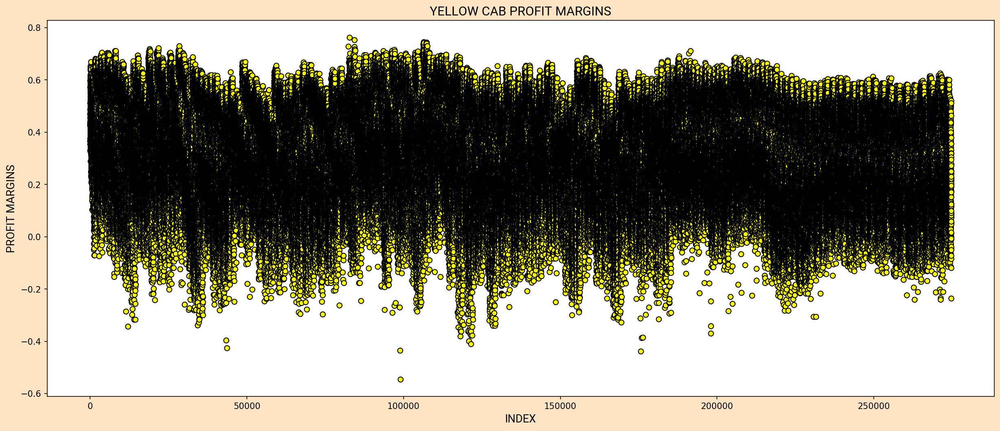

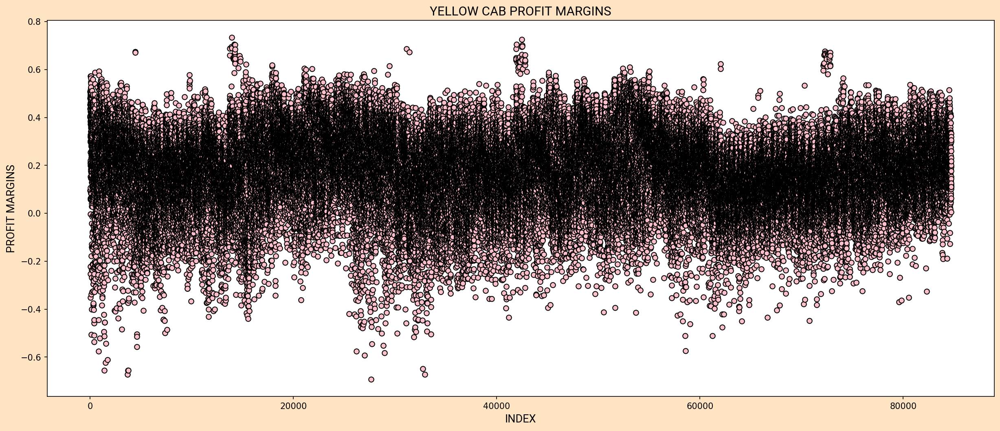

In [171]:
# Create figure
fig23, ax23 = plt.subplots(figsize=(20, 8), dpi=150)
plt.scatter(ycab.index, ycab['profit_margin'], color='yellow', edgecolor='black')

# Configure characteristics
ax23.set_xlabel('INDEX', fontproperties=roboto, fontsize=13)
ax23.set_ylabel('PROFIT MARGINS', fontproperties=roboto, fontsize=13)
ax23.set_title('YELLOW CAB PROFIT MARGINS', fontproperties=roboto, fontsize=15)
fig23.set_facecolor('bisque')

# Save plot
fig23.savefig('yellow_plot_profit_margins.png')
plt.show()

# Create figure
fig22, ax22 = plt.subplots(figsize=(20, 8), dpi=150)
plt.scatter(pcab.index, pcab['profit_margin'], color='pink', edgecolor='black')

# Configure characteristics
ax22.set_xlabel('INDEX', fontproperties=roboto, fontsize=13)
ax22.set_ylabel('PROFIT MARGINS', fontproperties=roboto, fontsize=13)
ax22.set_title('YELLOW CAB PROFIT MARGINS', fontproperties=roboto, fontsize=15)
fig22.set_facecolor('bisque')

# Save plot
fig22.savefig('pink_plot_profit_margins.png')
plt.show()


In [172]:
# - We can see that Yellow Cab's individual profit margins, are much tighter and involve less clustering than
#   Pink cab's profit margins, this suggests that Yellow Cab 'runs a tighter ship' in the literal sense. 